# Embedding Clustering Test

In [4]:
import sys
import os
from omegaconf import OmegaConf
from hydra import compose, initialize
from hydra.core.global_hydra import GlobalHydra
import matplotlib.pyplot as plt
plt.rcParams['font.size'] = 15  # Adjust the number as needed
plt.rcParams['figure.dpi'] = 300

# Add the root directory to sys.path
sys.path.append(os.path.abspath('..'))
GlobalHydra.instance().clear()
initialize(version_base=None, config_path="../configs", job_name="test_app")
cfg = compose(config_name="config")

In [2]:
# funcs.py
# TODO: Move the functions that do not belong here
import numpy as np
import pandas as pd
import torch
import itertools
from tqdm import tqdm
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
from scipy.optimize import linear_sum_assignment
from src.models.contrastiveModels import TimeSeriesSimCLRWithAdversary, TimeSeriesSimCLR
from src.datasets.contrastiveDatasets import create_embeddingDataset, create_embeddingLoader
from src.util.funcs import set_all_seeds

# need to move the next 3 aswell
def plot_confusion_matrix(crosstab):
    """
    Plot the confusion matrix calculated using pd.crosstab.
    If save_path is provided, save the plot as an image, otherwise plot to the output.
    
    Args:
        crosstab (pd.DataFrame): The confusion matrix calculated using pd.crosstab.
        save_path (str or None): Path to save the image. If None, the plot is displayed.
    """
    plt.figure(figsize=(8, 6))
    sns.heatmap(crosstab, annot=True, fmt='d', cmap='Blues')
    plt.title('Confusion Matrix')
    plt.ylabel(crosstab.index.name or 'Actual')
    plt.xlabel(crosstab.columns.name or 'Predicted')

    plt.show()

def matchClusters(cfg, df, novel_col, target_col):
    # Extract the true and predicted labels
    y_true = df[target_col].to_numpy()
    y_pred = df[novel_col].to_numpy()
    
    # Create the cost matrix for the Hungarian algorithm
    cost_matrix = np.zeros((len(set(y_true)), len(set(y_pred))))
    
    for i, valid_cluster in enumerate(set(y_true)):
        for j, novel_cluster in enumerate(set(y_pred)):
            cost_matrix[i, j] = -np.sum((y_true == valid_cluster) & (y_pred == novel_cluster))
    
    # Use the Hungarian algorithm to find the best cluster matching
    row_ind, col_ind = linear_sum_assignment(cost_matrix)
    matched_clusters = list(zip(row_ind, col_ind))
    
    # Reorder the predicted labels according to the best matching
    y_pred_reordered = np.zeros_like(y_pred)
    for i, j in zip(row_ind, col_ind):
        y_pred_reordered[y_pred == j] = i
    
    # Update the dataset with the reassigned cluster labels
    df[novel_col] = y_pred_reordered
    print(f"Best Cluster Matching: {matched_clusters}")
    return df

def compareClusterings(cfg, df, x_col, y_col):
    # Extract the true and predicted labels
    scores_x = df[x_col].to_numpy()
    scores_y = df[y_col].to_numpy()
    
    # Compute ARI and NMI
    ari_score = adjusted_rand_score(scores_x, scores_y)
    nmi_score = normalized_mutual_info_score(scores_x, scores_y)
    
    # Calculate the confusion matrix with the reordered predictions
    confusion = pd.crosstab(scores_y, scores_x, rownames=[y_col], colnames=[x_col])
    
    # Calculate Cluster Accuracy
    correct_assignments = np.sum(np.diag(confusion.values))
    total_assignments = np.sum(confusion.values)
    cluster_accuracy = correct_assignments / total_assignments

    # Print the results
    print(f"Adjusted Rand Index (ARI): {ari_score}")
    print(f"Normalized Mutual Information (NMI): {nmi_score}")
    print(f"Cluster Accuracy: {cluster_accuracy:.4f}")
    print("Confusion Matrix:")
    plot_confusion_matrix(confusion)

# Todo: The next two functions need to be moved to preprocess.py
def calc_alternative_ratios(df: pd.DataFrame) -> pd.DataFrame:
    """
    Calculate alternative ratio metrics
    
    Args:
        df (pd.DataFrame): The dataset containing features to calculate new ratios
        
    Returns:
        pd.DataFrame: A DataFrame with the new ratios
    """

    df['use_Dur_ratio_alt'] = (df['use_Dur_aff'] - df['use_Dur_nonaff'])/(df['use_Dur_aff'] + df['use_Dur_nonaff'])
    df['use_Dur_unilat_ratio_alt'] = (df['use_Dur_unilat_aff'] - df['use_Dur_unilat_nonaff'])/(df['use_Dur_unilat_aff'] + df['use_Dur_unilat_nonaff'])
    df['mean_Magn_ratio_alt'] = (df['mean_AC_aff'] - df['mean_AC_nonaff'])/(df['mean_AC_aff'] + df['mean_AC_nonaff'])
    df['Median_Magn_ratio_alt'] = (df['Median_AC_aff'] - df['Median_AC_nonaff'])/(df['Median_AC_aff'] + df['Median_AC_nonaff'])
    df['unilat_Magn_ratio_alt'] = (df['mean_AC_unilat_aff'] - df['mean_AC_unilat_nonaff'])/(df['mean_AC_unilat_aff'] + df['mean_AC_unilat_nonaff'])

    df['mean_Jerk_ratio'] = df['mean_Jerk_aff']/df['mean_Jerk_nonaff']
    df['median_Jerk_ratio'] = df['median_Jerk_aff']/df['median_Jerk_nonaff']
    df['mean_Jerk_ratio_alt'] = (df['mean_Jerk_aff'] - df['mean_Jerk_nonaff'])/(df['mean_Jerk_aff'] + df['mean_Jerk_nonaff'])
    df['median_Jerk_ratio_alt'] = (df['median_Jerk_aff'] - df['median_Jerk_nonaff'])/(df['median_Jerk_aff'] + df['median_Jerk_nonaff'])

    return df
    
def order_clusters(df, cluster_col, feature_cols):
    cluster_means = df.groupby(cluster_col)[feature_cols].mean()
    
    if len(feature_cols) > 1:
        cluster_values = cluster_means.apply(np.linalg.norm, axis=1)
    else:
        cluster_values = cluster_means[feature_cols[0]]
    
    ordered_clusters = cluster_values.sort_values().index
    
    cluster_mapping = {old: new for new, old in enumerate(ordered_clusters)}
    
    df[cluster_col] = df[cluster_col].map(cluster_mapping)
    return df

def getEmbeddingCompdf(cfg): # Todo: add paths to cfg
    df_fma = pd.read_csv('/cluster/work/vogtlab/Group/jamoser/classifier_data/fma_clinical.csv')
    df_IMU = pd.read_csv('~/Notebooks/Data/data_merged_incl.GAIT_TH2_Recalculated_with_Jerk.csv')
    df_combined = pd.merge(df_fma, df_IMU, on=['Pat_id', 'visit'], how='left')
    
    df_combined = calc_alternative_ratios(df_combined)

    scaler = StandardScaler()
    scaled_fma = scaler.fit_transform(df_combined[['fma_ue_aff_total']])

    # Initialize and fit the KMeans model
    kmeans = KMeans(n_clusters=cfg.ml.num_categories, random_state=cfg.seed)
    clusters_fma = kmeans.fit_predict(scaled_fma)
    df_combined['cluster_fma'] = clusters_fma

    df_combined = order_clusters(df_combined, 'cluster_fma', ['fma_ue_aff_total'])
    return df_combined

def getMLFeatures(cfg): # Pack ds irgendi util für ml models
    feature_columns = [
    'wrist_aff__acc_x', 'wrist_aff__acc_y', 'wrist_aff__acc_z',
    'wrist_aff__gyro_x', 'wrist_aff__gyro_y', 'wrist_aff__gyro_z',
    'wrist_nonaff__acc_x', 'wrist_nonaff__acc_y', 'wrist_nonaff__acc_z',
    'wrist_nonaff__gyro_x', 'wrist_nonaff__gyro_y', 'wrist_nonaff__gyro_z'
    ] if cfg.ml.useGyro else [
    'wrist_aff__acc_x', 'wrist_aff__acc_y', 'wrist_aff__acc_z',
    'wrist_nonaff__acc_x', 'wrist_nonaff__acc_y', 'wrist_nonaff__acc_z',
    ]

    return feature_columns

def calculateEmbeddings(cfg, model, loader):
    model.eval()

    # Dictionary to store embeddings
    embeddings_dict = {}
    
    with torch.no_grad():
        # Wrap loader with tqdm
        for batch in tqdm(loader, desc="Generating embeddings", unit="batch"):
            # Assuming batch is (timeseries, keys)
            timeseries, keys = batch[0], batch[1]
            
            # Get embeddings for the batch
            batch_embeddings = model(timeseries)
            # Move embeddings to CPU and convert to numpy for storage
            batch_embeddings = batch_embeddings.cpu().numpy()
            
            # Store embeddings by key
            for key, embedding in zip(keys, batch_embeddings):
                if key not in embeddings_dict:
                    embeddings_dict[key] = []
                embeddings_dict[key].append(embedding)
    
    rows = []
    for key, embeddings in embeddings_dict.items():
        for embedding in embeddings:
            # Create the original key and short key (without T1 suffix)
            short_key = '/'.join(key.split('_')[0].split('/'))  # This removes everything after '_'
            rows.append({
                'key': key,
                'short_key': short_key,
                'embedding': embedding
            })
    
    # Create dataframe
    df = pd.DataFrame(rows)

    embedding_matrix = np.stack(df['embedding'].apply(lambda x: np.array(x)).values)

    # Add Pat_id and visit
    df['Pat_id'] = df['short_key'].apply(lambda x: x.split('/')[2][:5])
    df['visit'] = df['short_key'].apply(lambda x: x.split('/')[1])
    
    return df, embedding_matrix

def clusterEmbeddings(cfg, df, embedding_matrix):
    kmeans = KMeans(n_clusters=cfg.ml.num_categories, random_state=cfg.seed)
    cluster_labels = kmeans.fit_predict(embedding_matrix)
    df['cluster'] = cluster_labels
    return df

def projectEmbeddings(cfg, df, embedding_matrix):
    pca = PCA(n_components=cfg.ml.p_components)
    embeddings_kd = pca.fit_transform(embedding_matrix)
    column_names = [f'PC{i}' for i in range(1, cfg.ml.p_components + 1)]
    pca_df = pd.DataFrame(embeddings_kd, columns=column_names)

    # Concatenate the PCA DataFrame with the original DataFrame
    combined_df = pd.concat([df.reset_index(drop=True), pca_df], axis=1)
    return combined_df

def generatePCPairs(cfg):
    column_names = [f'PC{i}' for i in range(1, cfg.ml.p_components + 1)]
    pairs = list(itertools.combinations(column_names, 2))
    return pairs

def visualize_lowdimensional_clusters(cfg, 
                                    df: pd.DataFrame,
                                    x_col: str = 'PC1', 
                                    y_col: str = 'PC2',
                                    color_cols: list = ['cluster'],
                                    plot_days: list = None,
                                    titles: list = None) -> None:
    """
    Creates scatter plots of low-dimensional data, with one subplot for each color column.
    Can either display plots or save them to a specified directory.

    Args:
    - df (pd.DataFrame): DataFrame containing the data
    - cfg: Configuration object containing save settings
    - x_col (str): Column name for x-axis
    - y_col (str): Column name for y-axis
    - color_cols (list): List of column names to use for coloring points
    - plot_days (list): If specified, filters data to these days
    - titles (list): Optional list of titles for each subplot. If None, uses color_col names
    """
    # Filter by days if specified
    if plot_days:
        df = df[df['visit'].isin(plot_days)]
        print(f'\nPlot days {plot_days}')
    else:
        print(f'\nPlot all days')

    # Use provided titles or default to color_cols names
    if titles is None:
        titles = color_cols

    # Determine if saving plots
    save_plots = hasattr(cfg, 'save_directory') and cfg.save_directory is not None

    for color_col, title in zip(color_cols, titles):
        # Create new figure for each plot
        plt.figure(figsize=(10, 8))
        
        # Create scatter plot
        unique_values = sorted(df[color_col].unique())
        for value in unique_values:
            mask = df[color_col] == value
            count = mask.sum()
            plt.scatter(df.loc[mask, x_col], 
                       df.loc[mask, y_col], 
                       label=f'{value}, n:{count}',
                       edgecolor='k',
                       s=50)

        # Set labels and title
        plt.xlabel(x_col)
        plt.ylabel(y_col)
        plt.title(title)
        plt.legend(loc='upper right')
        plt.axis('equal')

        if save_plots:
            # Create filename from title
            filename = f"{title.lower().replace(' ', '_')}.png"
            save_path = os.path.join(cfg.save_directory, filename)
            # Ensure directory exists
            os.makedirs(cfg.save_directory, exist_ok=True)
            plt.savefig(save_path)
            plt.close()
        else:
            plt.show()

def groupBy_PM_Pair(cfg, df):
    key_clusters = df.groupby('short_key').agg({
        'cluster': [
            ('final', lambda x: x.mode()[0]),
            ('count', 'count'),
            ('unique_values', lambda x: list(x.value_counts().items()))
        ],
        **{f'PC{i}': ('mean', 'mean') for i in range(1, cfg.ml.p_components + 1)}  # Adding averages for each principal component
    }).reset_index()

    # Flatten the MultiIndex columns and ensure unique names
    key_clusters.columns = [
        '_'.join(col).strip() if isinstance(col, tuple) else col for col in key_clusters.columns.values
    ]

    # Remove '_mean' suffix from principal component columns
    key_clusters.columns = [col.replace('_mean', '') for col in key_clusters.columns]

    # Remove duplicates by keeping only the first occurrence of each unique name
    key_clusters = key_clusters.loc[:, ~key_clusters.columns.duplicated()]

    return key_clusters

def merge_Embeddings_and_FMA(cfg, df, df_fma):

    # Now we can merge with the FMA dataframe
    df = df_fma.merge(df, on=['Pat_id', 'visit'], how='inner')

    df['final_cluster'] = df['final_cluster'].astype(int)
    df['cluster_fma'] = df['cluster_fma'].astype(int)

    return df

def embeddingPipeline(cfg):
    model = TimeSeriesSimCLRWithAdversary.load_from_checkpoint(cfg.checkpoint_path)
    set_all_seeds(cfg.seed)

    feature_columns = getMLFeatures(cfg)
    
    dataset = create_embeddingDataset(cfg, feature_columns)
    loader = create_embeddingLoader(cfg, dataset)

    df, embedding_matrix = calculateEmbeddings(cfg, model, loader)
    
    # Add cluster labels to dataframe
    df = clusterEmbeddings(cfg, df, embedding_matrix)

    # Calculate k principle components
    df = projectEmbeddings(cfg, df, embedding_matrix)

    df_grouped = groupBy_PM_Pair(cfg, df)
    # PCA of averaged cluster assignment
    
    df_fma = getEmbeddingCompdf(cfg)
    df_merged = merge_Embeddings_and_FMA(cfg, df_grouped, df_fma)

    df_merged = matchClusters(cfg, df_merged, 'cluster_final', 'cluster_fma')

    compareClusterings(cfg, df_merged, 'cluster_final', 'cluster_fma')

    visualize_lowdimensional_clusters(cfg,
                                      merged,
                                      x_col='PC1',
                                      y_col='PC2',
                                      color_cols=['cluster_final', 'cluster_fma'],
                                      titles=['First two PC-Embeddings colored by Kmeans on Embeddings','First two PC-Embeddings colored by FMA category']
                                     )
    return df, df_grouped, df_merged

In [4]:
# funcs.py
import numpy as np
import pandas as pd
import torch
import itertools
from tqdm import tqdm
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
from scipy.optimize import linear_sum_assignment

from src.models.contrastiveModels import TimeSeriesSimCLRWithAdversary, TimeSeriesSimCLR
from src.datasets.contrastiveDatasets import create_embeddingDataset, create_embeddingLoader
from src.util.funcs import set_all_seeds

from src.util.funcs import getMLFeatures
from src.clustering.util import plot_confusion_matrix, matchClusters, compareClusterings
from src.feature_calculation.preprocess import calc_alternative_ratios, order_clusters

def getEmbeddingCompdf(cfg): # Todo: add paths to cfg
    df_fma = pd.read_csv('/cluster/work/vogtlab/Group/jamoser/classifier_data/fma_clinical.csv')
    df_IMU = pd.read_csv('~/Notebooks/Data/data_merged_incl.GAIT_TH2_Recalculated_with_Jerk.csv')
    df_combined = pd.merge(df_fma, df_IMU, on=['Pat_id', 'visit'], how='left')
    
    df_combined = calc_alternative_ratios(df_combined)

    scaler = StandardScaler()
    scaled_fma = scaler.fit_transform(df_combined[['fma_ue_aff_total']])

    # Initialize and fit the KMeans model
    kmeans = KMeans(n_clusters=cfg.ml.num_categories, random_state=cfg.seed)
    clusters_fma = kmeans.fit_predict(scaled_fma)
    df_combined['cluster_fma'] = clusters_fma

    df_combined = order_clusters(df_combined, 'cluster_fma', ['fma_ue_aff_total'])
    return df_combined

def calculateEmbeddings(cfg, model, loader):
    model.eval()

    # Dictionary to store embeddings
    embeddings_dict = {}
    
    with torch.no_grad():
        # Wrap loader with tqdm
        for batch in tqdm(loader, desc="Generating embeddings", unit="batch"):
            # Assuming batch is (timeseries, keys)
            timeseries, keys = batch[0], batch[1]
            
            # Get embeddings for the batch
            batch_embeddings = model(timeseries)
            # Move embeddings to CPU and convert to numpy for storage
            batch_embeddings = batch_embeddings.cpu().numpy()
            
            # Store embeddings by key
            for key, embedding in zip(keys, batch_embeddings):
                if key not in embeddings_dict:
                    embeddings_dict[key] = []
                embeddings_dict[key].append(embedding)
    
    rows = []
    for key, embeddings in embeddings_dict.items():
        for embedding in embeddings:
            # Create the original key and short key (without T1 suffix)
            short_key = '/'.join(key.split('_')[0].split('/'))  # This removes everything after '_'
            rows.append({
                'key': key,
                'short_key': short_key,
                'embedding': embedding
            })
    
    # Create dataframe
    df = pd.DataFrame(rows)

    embedding_matrix = np.stack(df['embedding'].apply(lambda x: np.array(x)).values)

    # Add Pat_id and visit
    df['Pat_id'] = df['short_key'].apply(lambda x: x.split('/')[2][:5])
    df['visit'] = df['short_key'].apply(lambda x: x.split('/')[1])
    
    return df, embedding_matrix

def clusterEmbeddings(cfg, df, embedding_matrix):
    kmeans = KMeans(n_clusters=cfg.ml.num_categories, random_state=cfg.seed)
    cluster_labels = kmeans.fit_predict(embedding_matrix)
    df['cluster'] = cluster_labels
    return df

def projectEmbeddings(cfg, df, embedding_matrix):
    pca = PCA(n_components=cfg.ml.p_components)
    embeddings_kd = pca.fit_transform(embedding_matrix)
    column_names = [f'PC{i}' for i in range(1, cfg.ml.p_components + 1)]
    pca_df = pd.DataFrame(embeddings_kd, columns=column_names)

    # Concatenate the PCA DataFrame with the original DataFrame
    combined_df = pd.concat([df.reset_index(drop=True), pca_df], axis=1)
    return combined_df

def generatePCPairs(cfg):
    column_names = [f'PC{i}' for i in range(1, cfg.ml.p_components + 1)]
    pairs = list(itertools.combinations(column_names, 2))
    return pairs

def visualize_lowdimensional_clusters(cfg, 
                                    df: pd.DataFrame,
                                    x_col: str = 'PC1', 
                                    y_col: str = 'PC2',
                                    color_cols: list = ['cluster'],
                                    plot_days: list = None,
                                    titles: list = None) -> None:
    """
    Creates scatter plots of low-dimensional data, with one subplot for each color column.
    Can either display plots or save them to a specified directory.

    Args:
    - df (pd.DataFrame): DataFrame containing the data
    - cfg: Configuration object containing save settings
    - x_col (str): Column name for x-axis
    - y_col (str): Column name for y-axis
    - color_cols (list): List of column names to use for coloring points
    - plot_days (list): If specified, filters data to these days
    - titles (list): Optional list of titles for each subplot. If None, uses color_col names
    """
    # Filter by days if specified
    if plot_days:
        df = df[df['visit'].isin(plot_days)]
        print(f'\nPlot days {plot_days}')
    else:
        print(f'\nPlot all days')

    # Use provided titles or default to color_cols names
    if titles is None:
        titles = color_cols

    # Determine if saving plots
    save_plots = hasattr(cfg, 'save_directory') and cfg.save_directory is not None

    for color_col, title in zip(color_cols, titles):
        # Create new figure for each plot
        plt.figure(figsize=(10, 8))
        
        # Create scatter plot
        unique_values = sorted(df[color_col].unique())
        for value in unique_values:
            mask = df[color_col] == value
            count = mask.sum()
            plt.scatter(df.loc[mask, x_col], 
                       df.loc[mask, y_col], 
                       label=f'{value}, n:{count}',
                       edgecolor='k',
                       s=50)

        # Set labels and title
        plt.xlabel(x_col)
        plt.ylabel(y_col)
        plt.title(title)
        plt.legend(loc='upper right')
        plt.axis('equal')

        if save_plots:
            # Create filename from title
            filename = f"{title.lower().replace(' ', '_')}.png"
            save_path = os.path.join(cfg.save_directory, filename)
            # Ensure directory exists
            os.makedirs(cfg.save_directory, exist_ok=True)
            plt.savefig(save_path)
            plt.close()
        else:
            plt.show()

def groupBy_PM_Pair(cfg, df):
    key_clusters = df.groupby('short_key').agg({
        'cluster': [
            ('final', lambda x: x.mode()[0]),
            ('count', 'count'),
            ('unique_values', lambda x: list(x.value_counts().items()))
        ],
        **{f'PC{i}': ('mean', 'mean') for i in range(1, cfg.ml.p_components + 1)}  # Adding averages for each principal component
    }).reset_index()

    # Flatten the MultiIndex columns and ensure unique names
    key_clusters.columns = [
        '_'.join(col).strip() if isinstance(col, tuple) else col for col in key_clusters.columns.values
    ]

    # Remove '_mean' suffix from principal component columns
    key_clusters.columns = [col.replace('_mean', '') for col in key_clusters.columns]

    # Remove duplicates by keeping only the first occurrence of each unique name
    key_clusters = key_clusters.loc[:, ~key_clusters.columns.duplicated()]

    key_clusters['Pat_id'] = key_clusters['short_key_'].apply(lambda x: x.split('/')[2][:5])
    key_clusters['visit'] = key_clusters['short_key_'].apply(lambda x: x.split('/')[1])
    
    return key_clusters

def merge_Embeddings_and_FMA(cfg, df, df_fma):

    # Now we can merge with the FMA dataframe
    df = df_fma.merge(df, on=['Pat_id', 'visit'], how='inner')

    df['cluster_final'] = df['cluster_final'].astype(int)
    df['cluster_fma'] = df['cluster_fma'].astype(int)

    return df

def embeddingPipeline(cfg):
    model = TimeSeriesSimCLRWithAdversary.load_from_checkpoint(cfg.checkpoint_path)
    set_all_seeds(cfg.seed)

    feature_columns = getMLFeatures(cfg)
    
    dataset = create_embeddingDataset(cfg, feature_columns)
    loader = create_embeddingLoader(cfg, dataset)

    df, embedding_matrix = calculateEmbeddings(cfg, model, loader)
    
    # Add cluster labels to dataframe
    df = clusterEmbeddings(cfg, df, embedding_matrix)

    # Calculate k principle components
    df = projectEmbeddings(cfg, df, embedding_matrix)

    df_grouped = groupBy_PM_Pair(cfg, df)
    # PCA of averaged cluster assignment
    
    df_fma = getEmbeddingCompdf(cfg)
    df_merged = merge_Embeddings_and_FMA(cfg, df_grouped, df_fma)

    df_merged = matchClusters(cfg, df_merged, 'cluster_final', 'cluster_fma')

    compareClusterings(cfg, df_merged, 'cluster_final', 'cluster_fma')

    visualize_lowdimensional_clusters(cfg,
                                      df_merged,
                                      x_col='PC1',
                                      y_col='PC2',
                                      color_cols=['cluster_final', 'cluster_fma'],
                                      titles=['First two PC-Embeddings colored by Kmeans on Embeddings','First two PC-Embeddings colored by FMA category']
                                     )
    return df, df_grouped, df_merged

In [37]:
from src.clustering.embeddings import embeddingPipeline
cfg.checkpoint_path =  '/cluster/work/vogtlab/Group/jamoser/checkpoints/w15m_th0.25/hyperparam_search/h064_p032_l02/lr1.0e-03_b032/wd1.0e-04_dr0.10_t0.10/noise0.05_mask0.15/20241212_105312/best_checkpoint.ckpt'

df, df_grouped, df_merged = embeddingPipeline(cfg)

RuntimeError: Error(s) in loading state_dict for TimeSeriesSimCLR:
	Unexpected key(s) in state_dict: "adversary.0.weight", "adversary.0.bias", "adversary.3.weight", "adversary.3.bias". 

[rank: 0] Seed set to 42
Generating embeddings: 100%|███████████████| 678/678 [05:02<00:00,  2.24batch/s]


Best Cluster Matching: [(0, 0), (1, 1), (2, 2)]
Adjusted Rand Index (ARI): 0.016738314671682235
Normalized Mutual Information (NMI): 0.05926704891013623
Cluster Accuracy: 0.3904
Confusion Matrix:


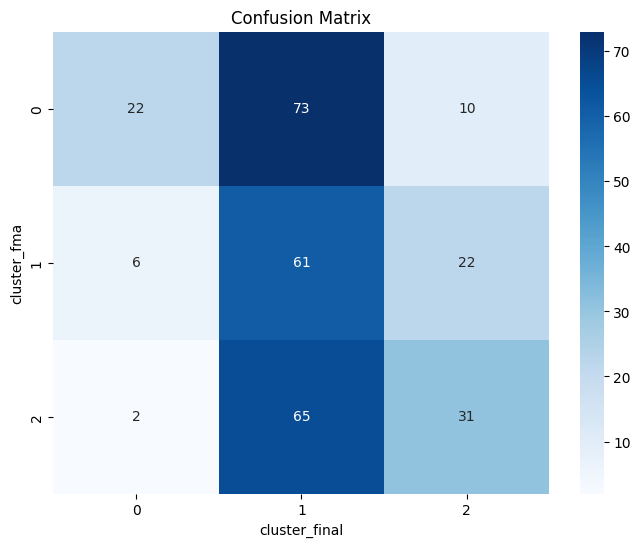


Plot all days


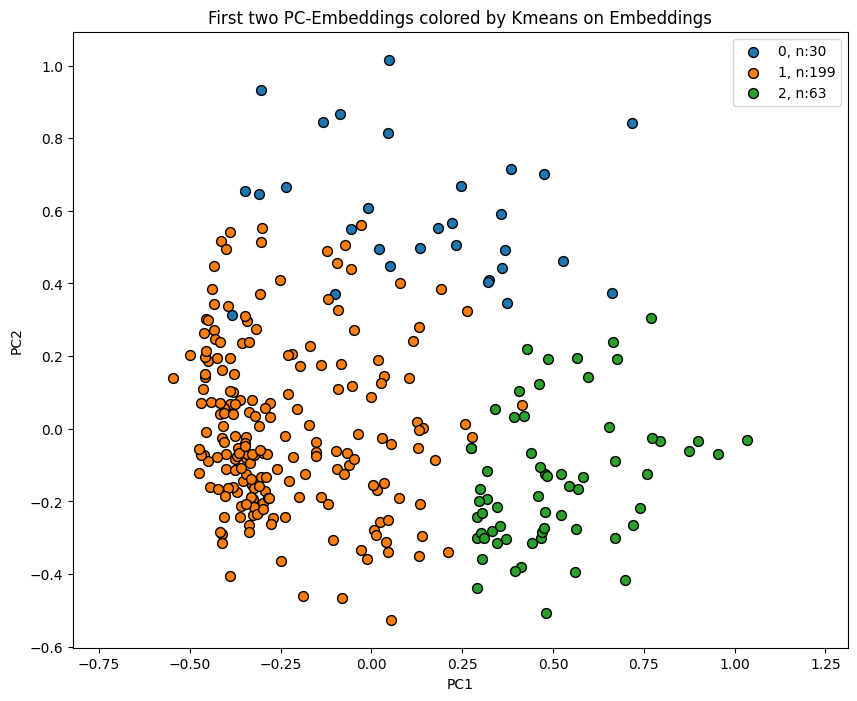

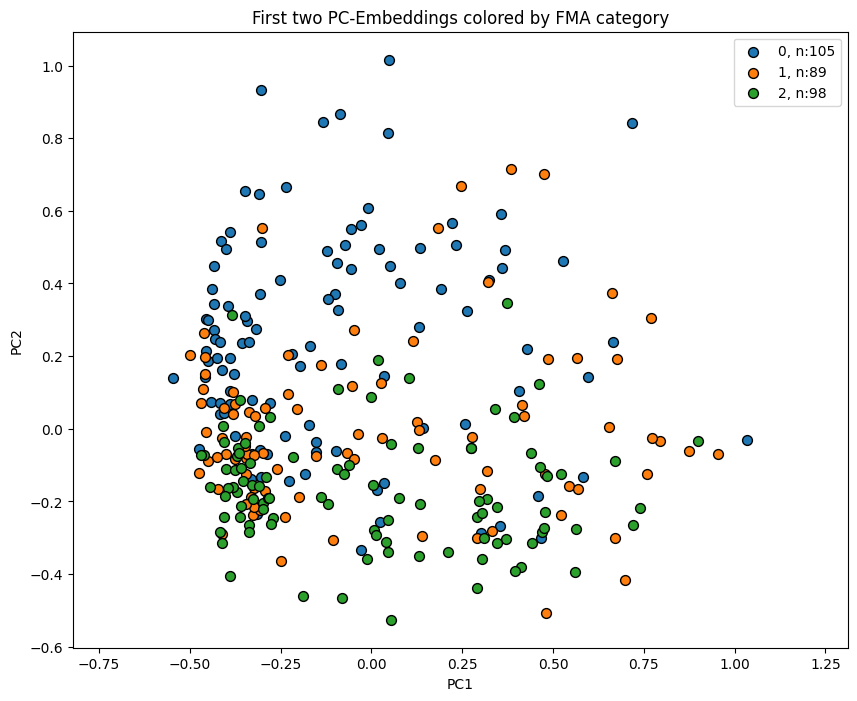

In [39]:
from src.clustering.embeddings import embeddingPipeline
cfg.checkpoint_path =  '/cluster/work/vogtlab/Group/jamoser/checkpoints/w15m_th0.1/hyperparam_search/h032_p064_l02/lr1.0e-03_b128/wd1.0e-06_dr0.30_t0.07/noise0.20_mask0.15/20241204_215111/best_checkpoint.ckpt'

df, df_grouped, df_merged = embeddingPipeline(cfg)

[rank: 0] Seed set to 42
Generating embeddings: 100%|███████████████| 678/678 [05:14<00:00,  2.15batch/s]


Best Cluster Matching: [(0, 0), (1, 1), (2, 2)]
Adjusted Rand Index (ARI): 0.1789256994754889
Normalized Mutual Information (NMI): 0.24494274843051522
Cluster Accuracy: 0.5240
Confusion Matrix:


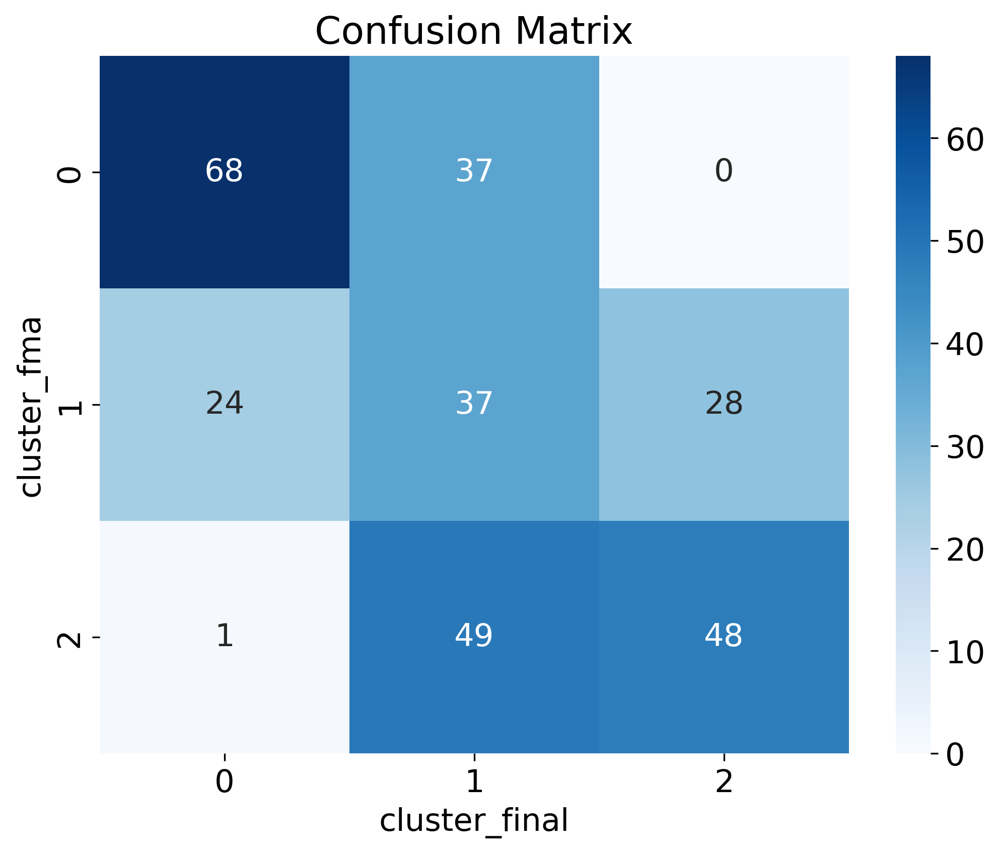


Plot all days


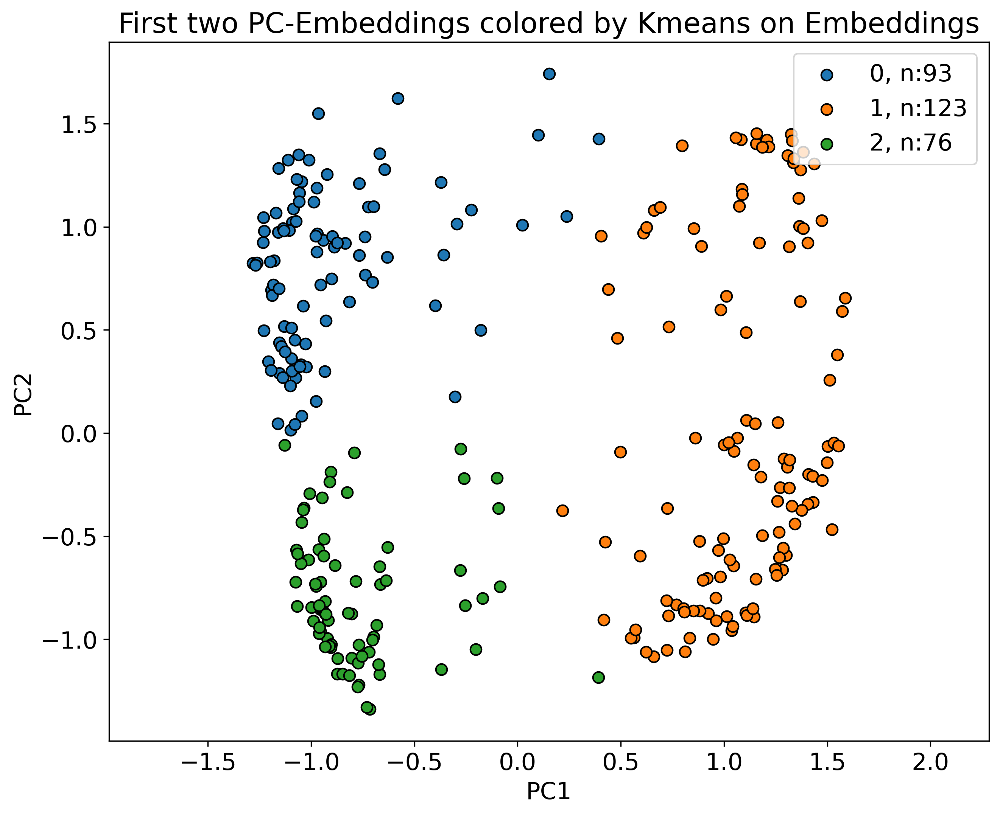

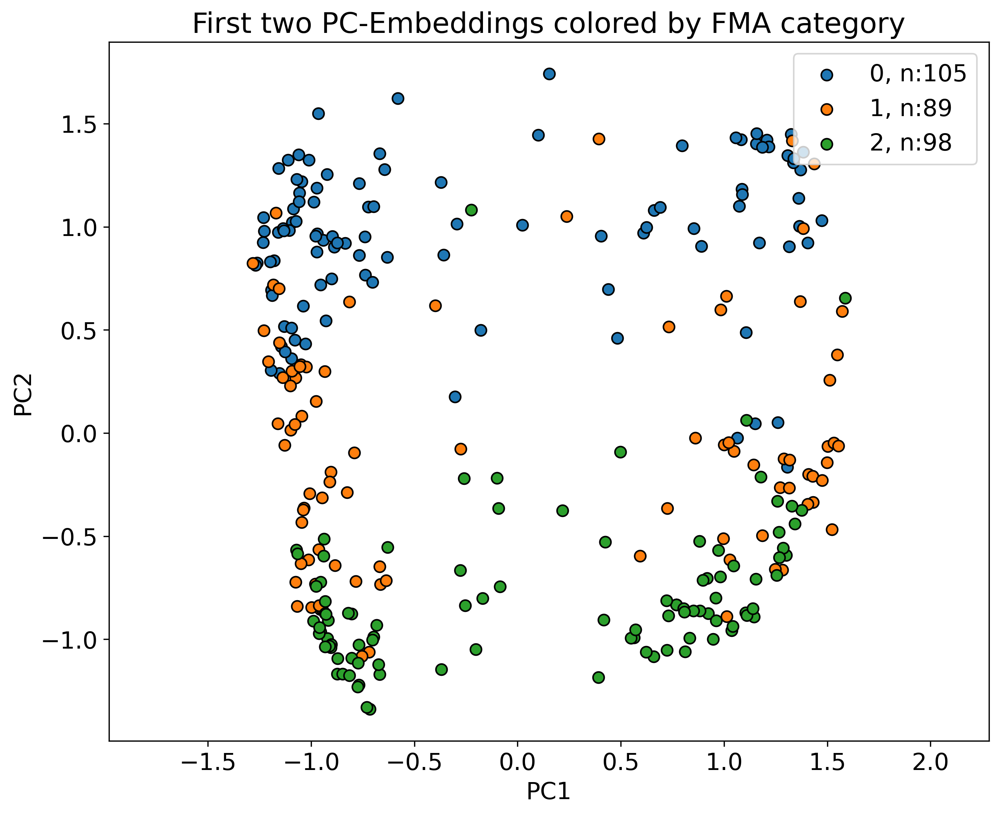

In [3]:
from src.clustering.embeddings import embeddingPipeline
cfg.checkpoint_path =  '/cluster/work/vogtlab/Group/jamoser/checkpoints/w15m_th0.25/hyperparam_search/h032_p032_l03/lr1.0e-03_b064/wd1.0e-04_dr0.30_t0.07/noise0.10_mask0.30/20241219_124214/best_checkpoint.ckpt'

df, df_grouped, df_merged = embeddingPipeline(cfg)

In [11]:
import random

# Sample list
my_list = list(df['short_key'].unique())

# Randomly sample 10 elements
sampled_elements = random.sample(my_list, 10)

print(sampled_elements)

['/day3/RU079', '/day3/RU059', '/day365/RU037', '/day3/RU051', '/day90/RU053']


In [12]:
df_subset = df[df['short_key'].isin(sampled_elements)]
print(len(df))
print(len(df_subset))

43369
761


In [13]:
from src.clustering.embeddings import visualize_lowdimensional_clusters


Plot all days


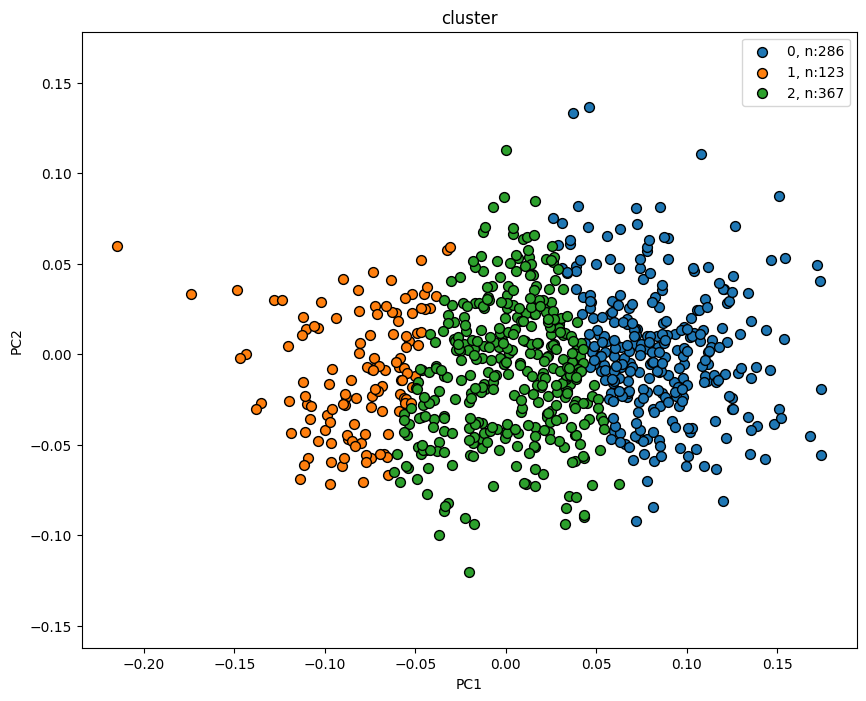

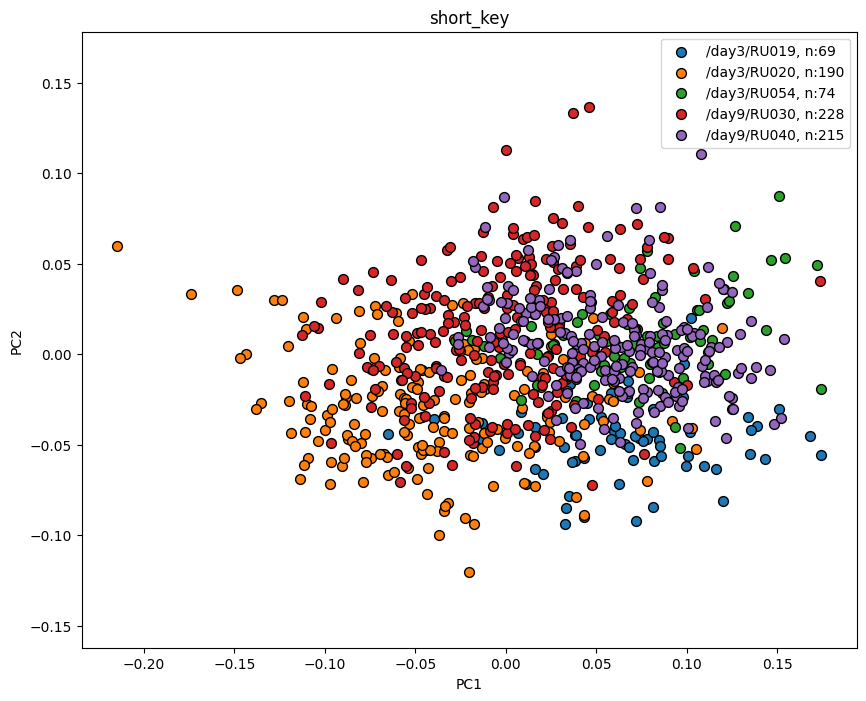

In [40]:
visualize_lowdimensional_clusters(cfg, df_subset, x_col='PC1', y_col='PC2', color_cols=['cluster', 'short_key'])


Plot all days


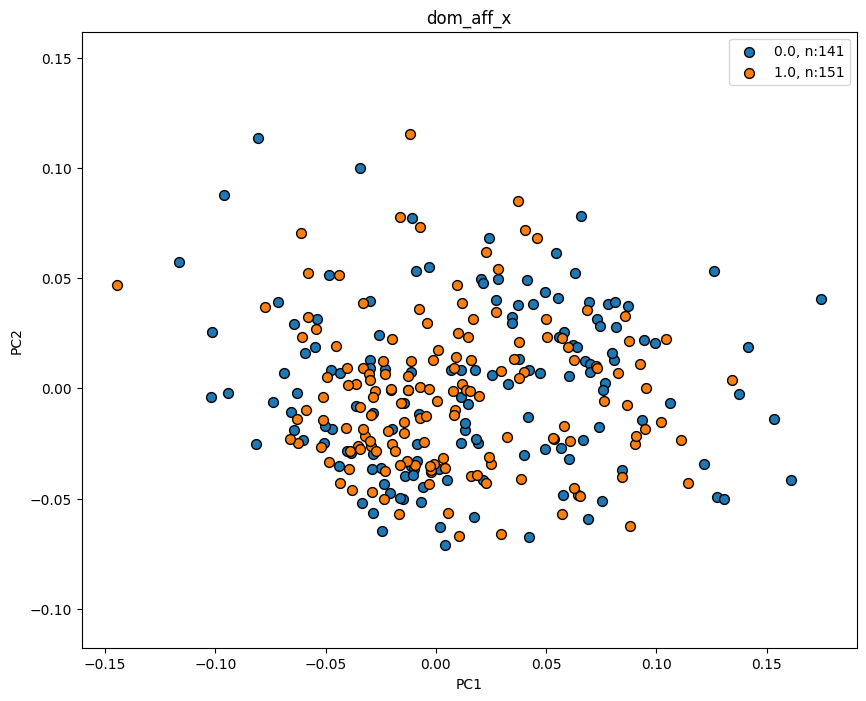

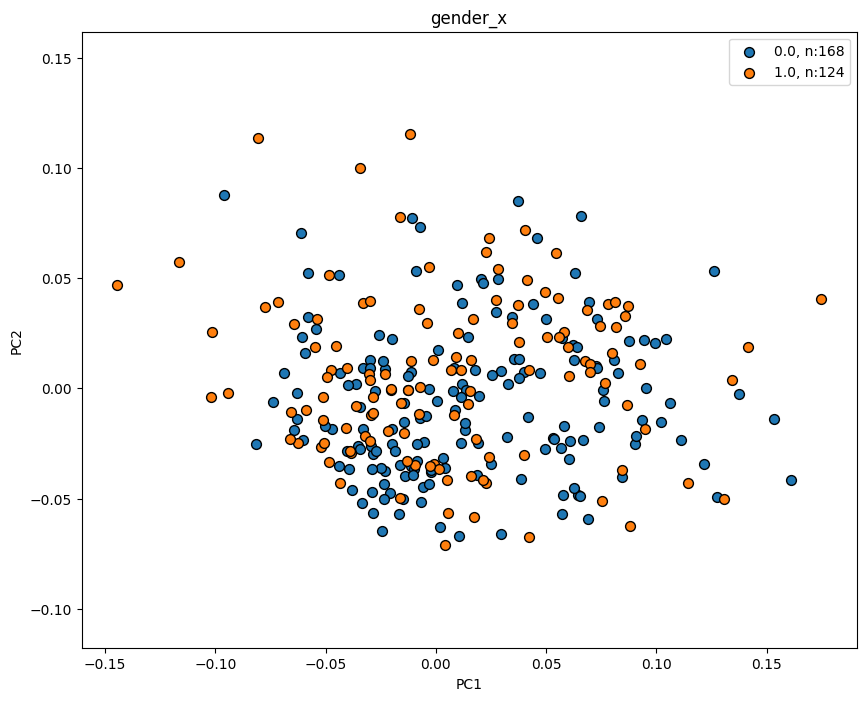

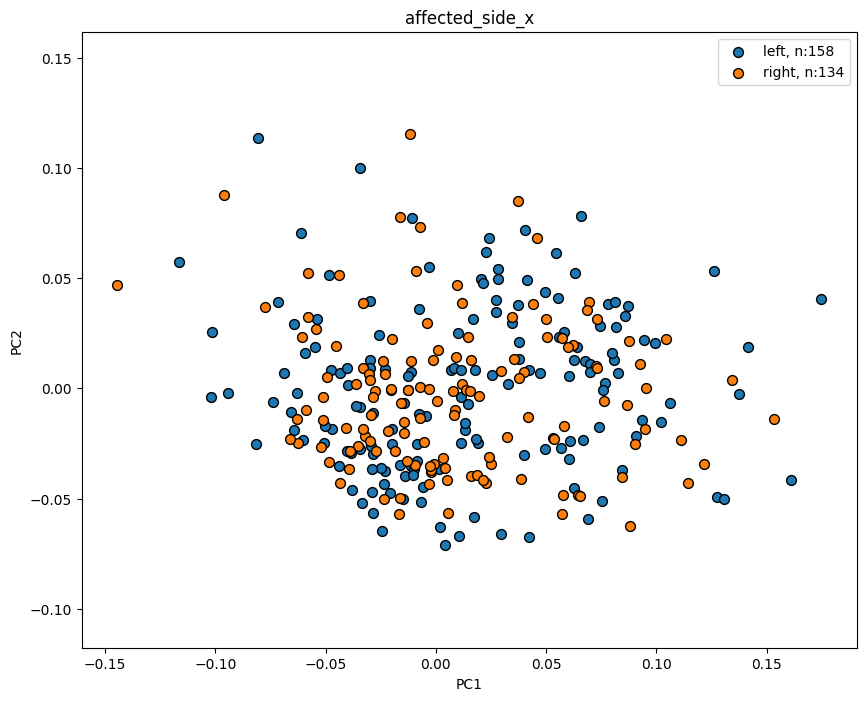

In [36]:
visualize_lowdimensional_clusters(cfg, df_merged, x_col='PC1', y_col='PC2', color_cols=['dom_aff_x', 'gender_x', 'affected_side_x'])


Plot all days


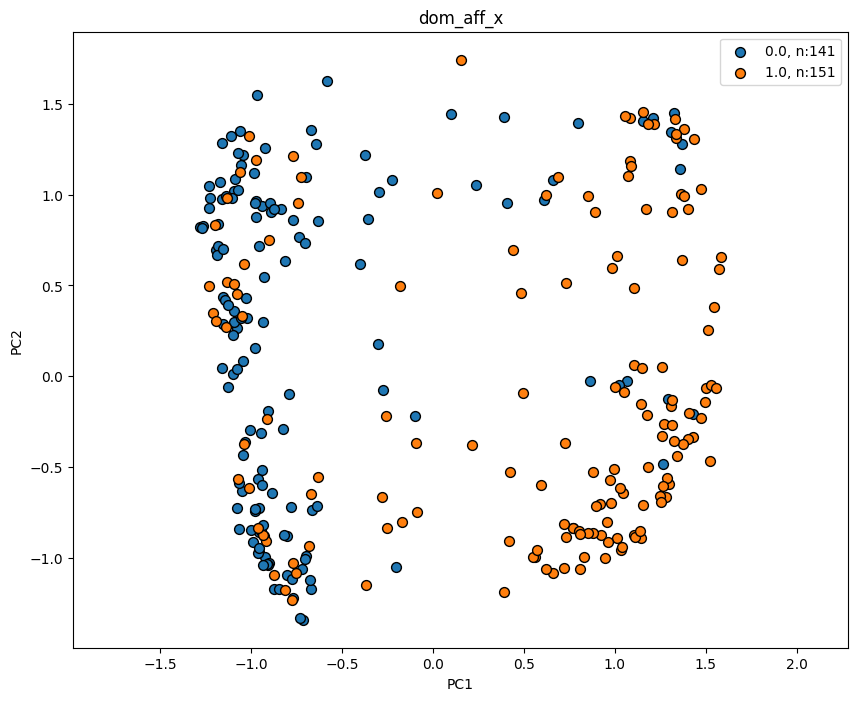

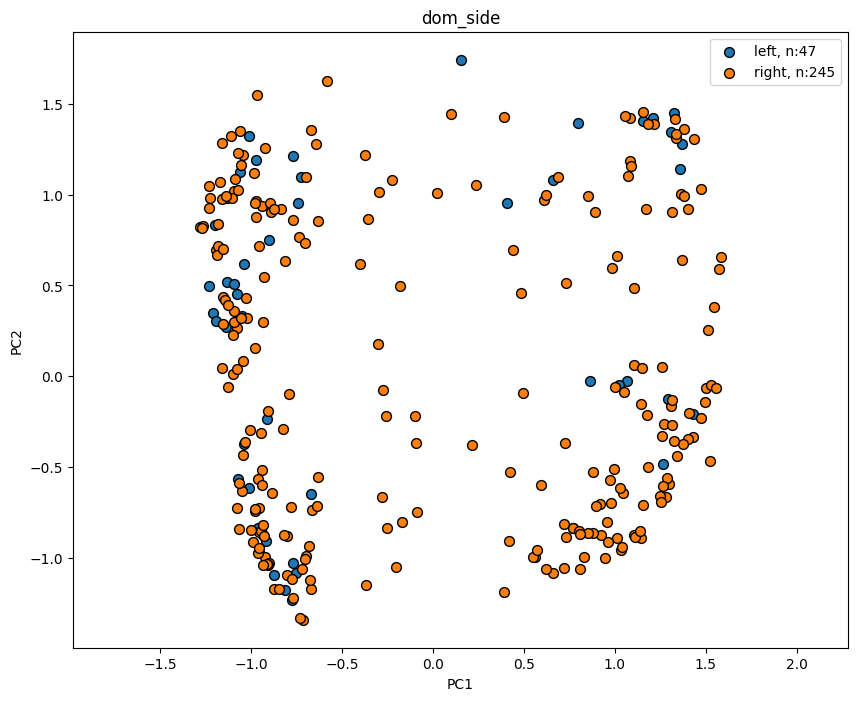

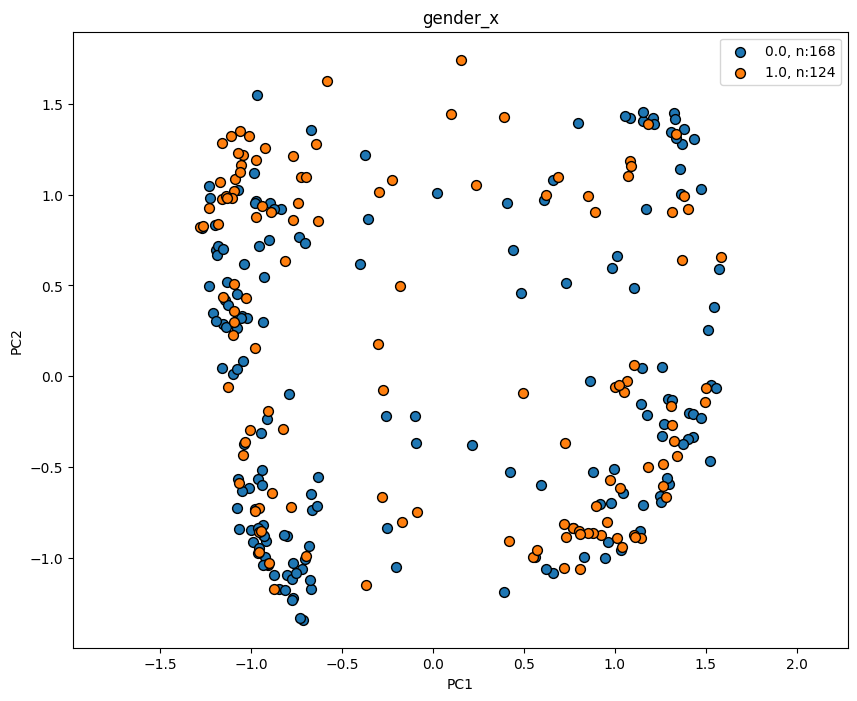

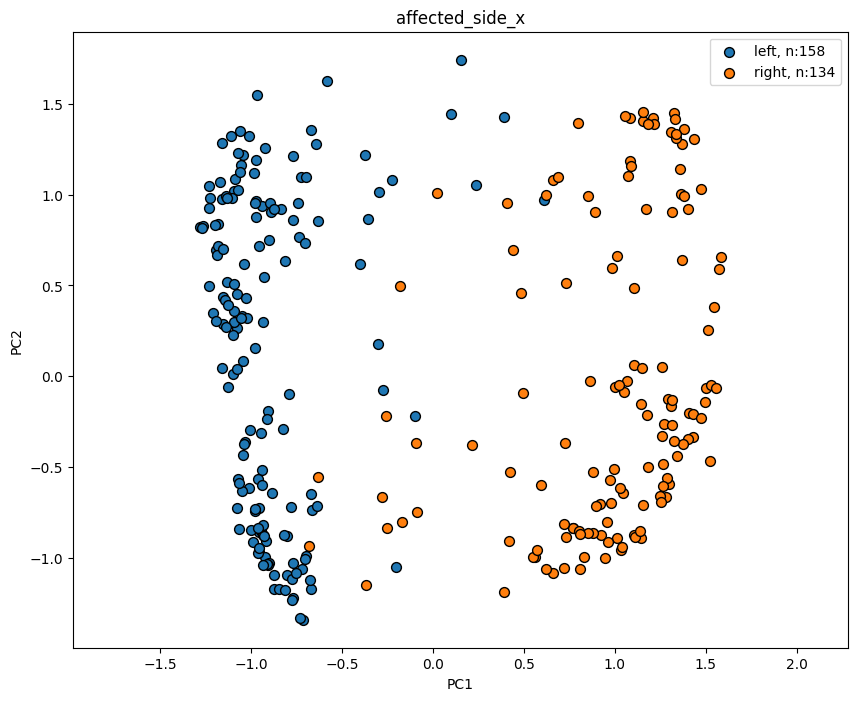

In [56]:
visualize_lowdimensional_clusters(cfg, df_merged, x_col='PC1', y_col='PC2', color_cols=['dom_aff_x', 'dom_side', 'gender_x', 'affected_side_x'])

[rank: 0] Seed set to 42
Generating embeddings: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 678/678 [04:15<00:00,  2.65batch/s]


Best Cluster Matching: [(0, 2), (1, 1), (2, 0)]
Adjusted Rand Index (ARI): 0.19868623840259275
Normalized Mutual Information (NMI): 0.2028476156078988
Cluster Accuracy: 0.5822
Confusion Matrix:


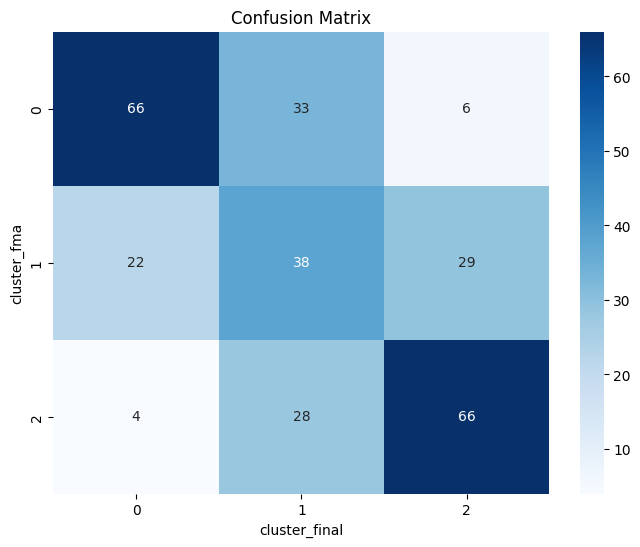


Plot all days


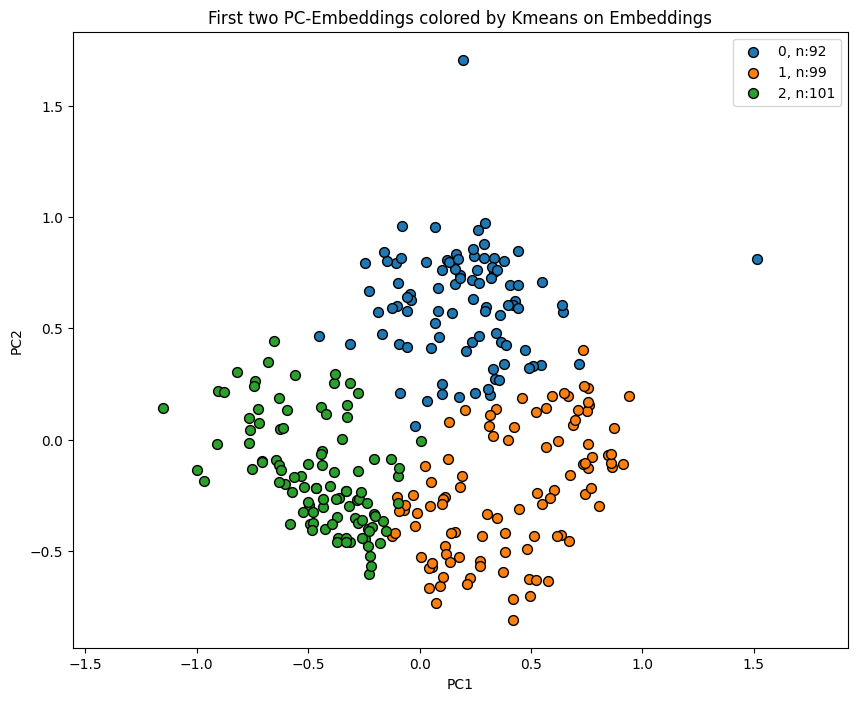

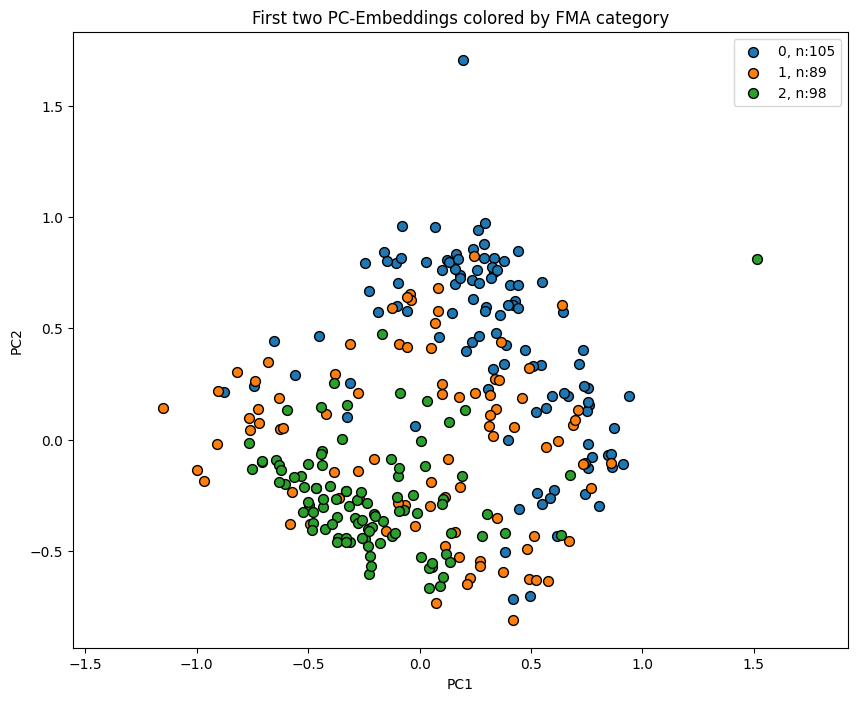

In [14]:
from src.clustering.embeddings import embeddingPipeline
cfg.checkpoint_path =  '/cluster/work/vogtlab/Group/jamoser/checkpoints/w15m_th0.25/hyperparam_search/h032_p032_l03/lr1.0e-03_b064/wd1.0e-04_dr0.30_t0.07/noise0.10_mask0.30/20241224_144758/best_checkpoint.ckpt'

df, df_grouped, df_merged = embeddingPipeline(cfg)

In [15]:
from src.clustering.embeddings import visualize_lowdimensional_clusters


Plot all days


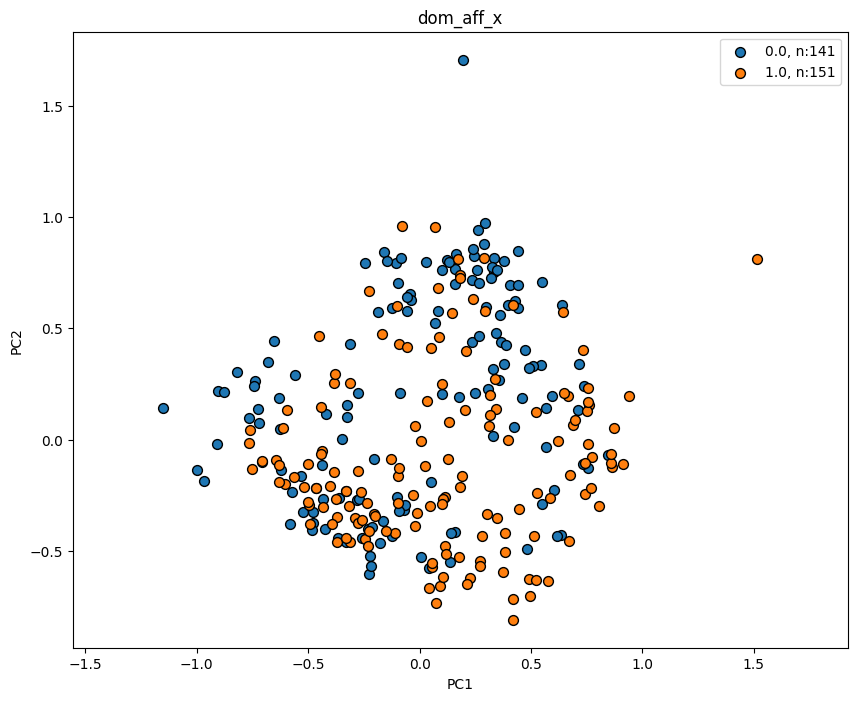

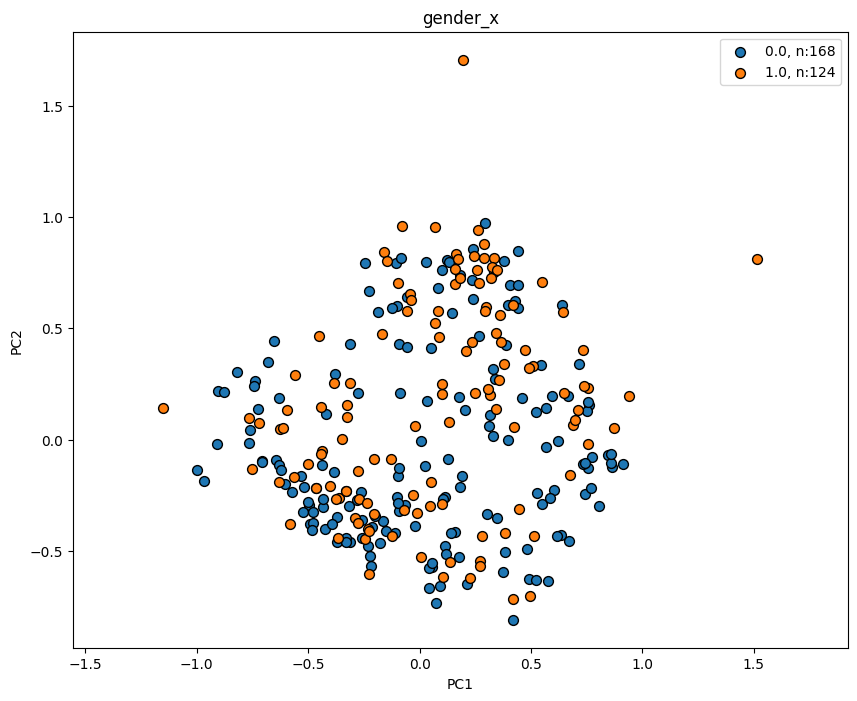

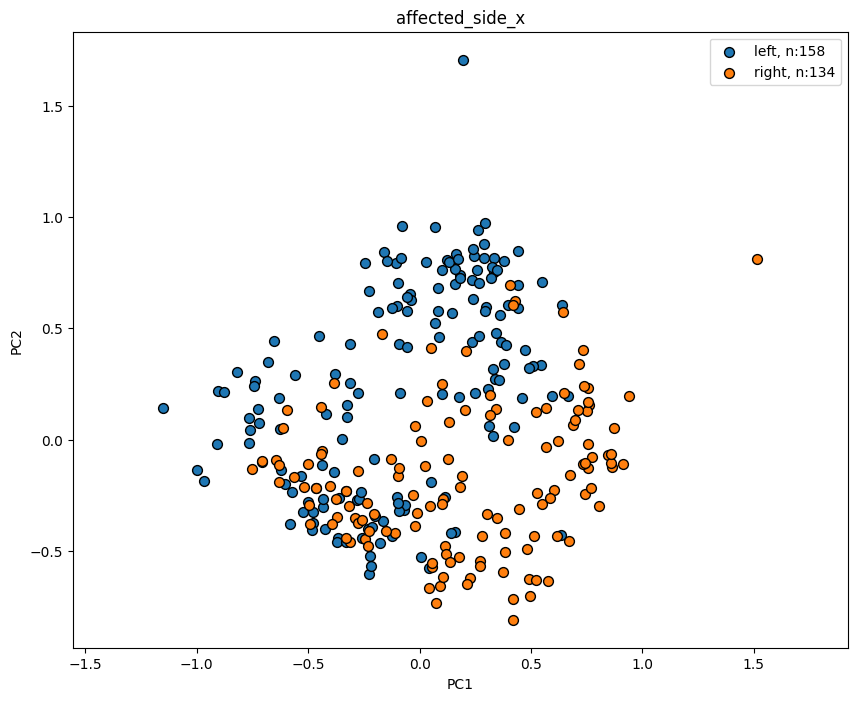

In [16]:
visualize_lowdimensional_clusters(cfg, df_merged, x_col='PC1', y_col='PC2', color_cols=['dom_aff_x', 'gender_x', 'affected_side_x'])


Plot all days


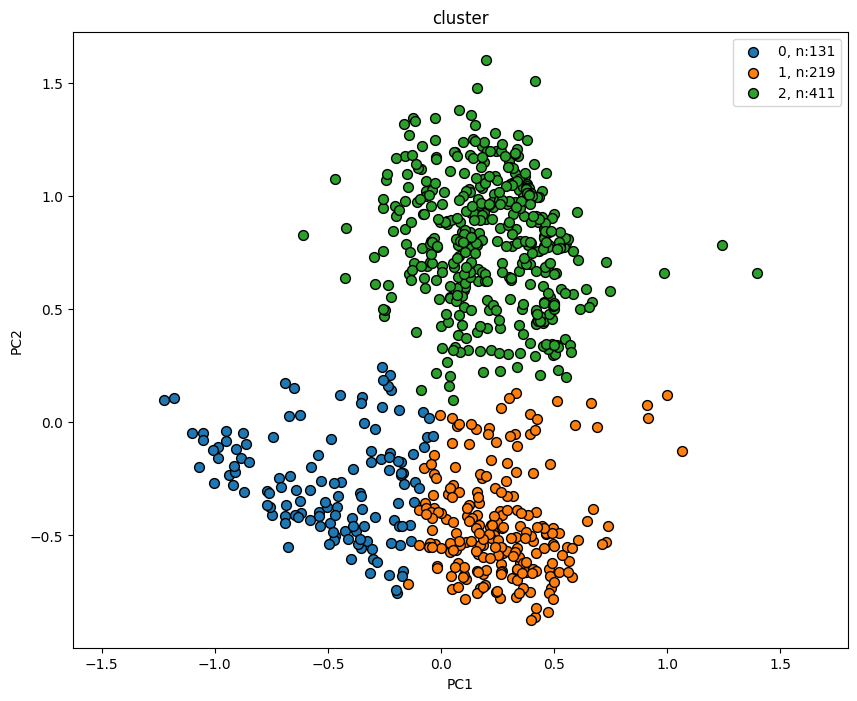

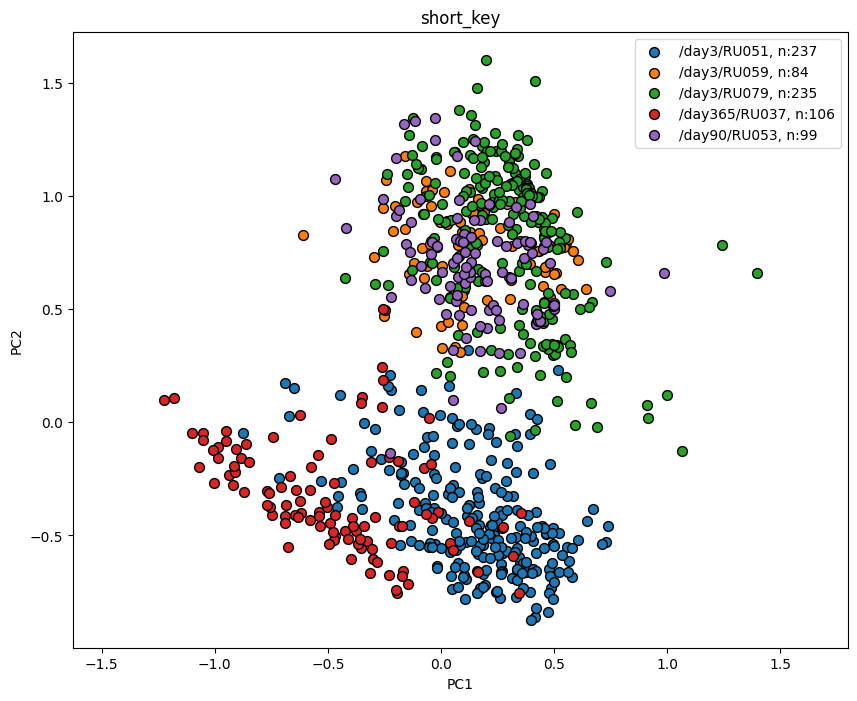

In [17]:
visualize_lowdimensional_clusters(cfg, df_subset, x_col='PC1', y_col='PC2', color_cols=['cluster', 'short_key'])

In [6]:
model = TimeSeriesSimCLR.load_from_checkpoint(cfg.checkpoint_path)
set_all_seeds(cfg.seed)

feature_columns = getMLFeatures(cfg)

dataset = create_embeddingDataset(cfg, feature_columns)
loader = create_embeddingLoader(cfg, dataset)

df, embedding_matrix = calculateEmbeddings(cfg, model, loader)

# Add cluster labels to dataframe
df = clusterEmbeddings(cfg, df, embedding_matrix)

# Calculate k principle components
df = projectEmbeddings(cfg, df, embedding_matrix)

df_grouped = groupBy_PM_Pair(cfg, df)
# PCA of averaged cluster assignment

[rank: 0] Seed set to 42
Generating embeddings: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 678/678 [04:36<00:00,  2.45batch/s]


In [13]:
def groupBy_PM_Pair(cfg, df):
    key_clusters = df.groupby('short_key').agg({
        'cluster': [
            ('final', lambda x: x.mode()[0]),
            ('count', 'count'),
            ('unique_values', lambda x: list(x.value_counts().items()))
        ],
        **{f'PC{i}': ('mean', 'mean') for i in range(1, cfg.ml.p_components + 1)}  # Adding averages for each principal component
    }).reset_index()

    # Flatten the MultiIndex columns and ensure unique names
    key_clusters.columns = [
        '_'.join(col).strip() if isinstance(col, tuple) else col for col in key_clusters.columns.values
    ]

    # Remove '_mean' suffix from principal component columns
    key_clusters.columns = [col.replace('_mean', '') for col in key_clusters.columns]

    # Remove duplicates by keeping only the first occurrence of each unique name
    key_clusters = key_clusters.loc[:, ~key_clusters.columns.duplicated()]

    key_clusters['Pat_id'] = key_clusters['short_key_'].apply(lambda x: x.split('/')[2][:5])
    key_clusters['visit'] = key_clusters['short_key_'].apply(lambda x: x.split('/')[1])
    
    return key_clusters

In [14]:
df_grouped = groupBy_PM_Pair(cfg, df)

In [15]:
print(df.info())
print(df_grouped.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43369 entries, 0 to 43368
Data columns (total 11 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   key        43369 non-null  object 
 1   short_key  43369 non-null  object 
 2   embedding  43369 non-null  object 
 3   Pat_id     43369 non-null  object 
 4   visit      43369 non-null  object 
 5   cluster    43369 non-null  int32  
 6   PC1        43369 non-null  float32
 7   PC2        43369 non-null  float32
 8   PC3        43369 non-null  float32
 9   PC4        43369 non-null  float32
 10  PC5        43369 non-null  float32
dtypes: float32(5), int32(1), object(5)
memory usage: 2.6+ MB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   short_key_             292 non-null    object 
 1   cluster_final          292 non-null   

In [18]:
df_fma = getEmbeddingCompdf(cfg)
df_merged = merge_Embeddings_and_FMA(cfg, df_grouped, df_fma)

df_merged = matchClusters(cfg, df_merged, 'cluster_final', 'cluster_fma')

compareClusterings(cfg, df_merged, 'cluster_final', 'cluster_fma')

visualize_lowdimensional_clusters(cfg,
                                  merged,
                                  x_col='PC1',
                                  y_col='PC2',
                                  color_cols=['cluster_final', 'cluster_fma'],
                                  titles=['First two PC-Embeddings colored by Kmeans on Embeddings','First two PC-Embeddings colored by FMA category']
                                 )

NameError: name 'np' is not defined

In [2]:
from src.clustering.embeddings.funcs import getMLFeatures, calculateEmbeddings, clusterEmbeddings, projectEmbeddings, groupBy_PM_Pair, generatePCPairs, visualize_lowdimensional_clusters, getEmbeddingCompdf
from src.models.contrastiveModels import TimeSeriesSimCLRWithAdversary
from src.datasets.contrastiveDatasets import create_embeddingDataset, create_embeddingLoader
from src.util.funcs import set_all_seeds

In [3]:
checkpoint = '/cluster/work/vogtlab/Group/jamoser/checkpoints/w15m_th0.25/hyperparam_search/h064_p032_l02/lr1.0e-03_b032/wd1.0e-04_dr0.10_t0.10/noise0.05_mask0.15/20241212_105312/best_checkpoint.ckpt'

model = TimeSeriesSimCLRWithAdversary.load_from_checkpoint(checkpoint)

In [4]:
set_all_seeds(cfg.seed)

[rank: 0] Seed set to 42


In [5]:
feature_columns = getMLFeatures(cfg)
print(feature_columns)

['wrist_aff__acc_x', 'wrist_aff__acc_y', 'wrist_aff__acc_z', 'wrist_aff__gyro_x', 'wrist_aff__gyro_y', 'wrist_aff__gyro_z', 'wrist_nonaff__acc_x', 'wrist_nonaff__acc_y', 'wrist_nonaff__acc_z', 'wrist_nonaff__gyro_x', 'wrist_nonaff__gyro_y', 'wrist_nonaff__gyro_z']


In [6]:
dataset = create_embeddingDataset(cfg, feature_columns)
loader = create_embeddingLoader(cfg, dataset)

In [7]:
df, embedding_matrix = calculateEmbeddings(cfg, model, loader)

Generating embeddings: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 678/678 [07:32<00:00,  1.50batch/s]


In [8]:
print(df.head())
print(embedding_matrix.shape)

              key    short_key  \
0  /day3/RU002_T1  /day3/RU002   
1  /day3/RU002_T1  /day3/RU002   
2  /day3/RU002_T1  /day3/RU002   
3  /day3/RU002_T1  /day3/RU002   
4  /day3/RU002_T1  /day3/RU002   

                                           embedding  
0  [0.9993451, 0.9999568, -0.9998025, -2.7548933e...  
1  [0.999946, 0.99995095, -0.99981874, -0.0001442...  
2  [0.99989563, 0.9999344, -0.9998172, -2.3443527...  
3  [0.9999552, 0.9999095, -0.99969697, -0.0003468...  
4  [0.99994963, 0.9999743, -0.9995993, -4.8127386...  
(43369, 128)


In [9]:
df_clustered = clusterEmbeddings(cfg, df, embedding_matrix)

In [10]:
print(df_clustered.head())

              key    short_key  \
0  /day3/RU002_T1  /day3/RU002   
1  /day3/RU002_T1  /day3/RU002   
2  /day3/RU002_T1  /day3/RU002   
3  /day3/RU002_T1  /day3/RU002   
4  /day3/RU002_T1  /day3/RU002   

                                           embedding  cluster  
0  [0.9993451, 0.9999568, -0.9998025, -2.7548933e...        1  
1  [0.999946, 0.99995095, -0.99981874, -0.0001442...        2  
2  [0.99989563, 0.9999344, -0.9998172, -2.3443527...        2  
3  [0.9999552, 0.9999095, -0.99969697, -0.0003468...        1  
4  [0.99994963, 0.9999743, -0.9995993, -4.8127386...        1  


In [11]:
df_projected = projectEmbeddings(cfg, df_clustered, embedding_matrix)

In [12]:
print(df_projected.head())

              key    short_key  \
0  /day3/RU002_T1  /day3/RU002   
1  /day3/RU002_T1  /day3/RU002   
2  /day3/RU002_T1  /day3/RU002   
3  /day3/RU002_T1  /day3/RU002   
4  /day3/RU002_T1  /day3/RU002   

                                           embedding  cluster       PC1  \
0  [0.9993451, 0.9999568, -0.9998025, -2.7548933e...        1 -0.108099   
1  [0.999946, 0.99995095, -0.99981874, -0.0001442...        2 -0.045463   
2  [0.99989563, 0.9999344, -0.9998172, -2.3443527...        2  0.035279   
3  [0.9999552, 0.9999095, -0.99969697, -0.0003468...        1 -0.038094   
4  [0.99994963, 0.9999743, -0.9995993, -4.8127386...        1 -0.121969   

        PC2       PC3       PC4       PC5  
0 -0.051106  0.027343  0.002641 -0.006717  
1 -0.039998  0.048629 -0.004485 -0.006021  
2 -0.009719  0.058987 -0.014984  0.022708  
3  0.048619  0.010741 -0.001770 -0.036697  
4  0.036261 -0.011537  0.007510 -0.048504  


In [13]:
pc_pairs = generatePCPairs(cfg)

In [14]:
print(pc_pairs)

[('PC1', 'PC2'), ('PC1', 'PC3'), ('PC1', 'PC4'), ('PC1', 'PC5'), ('PC2', 'PC3'), ('PC2', 'PC4'), ('PC2', 'PC5'), ('PC3', 'PC4'), ('PC3', 'PC5'), ('PC4', 'PC5')]



Plot all days


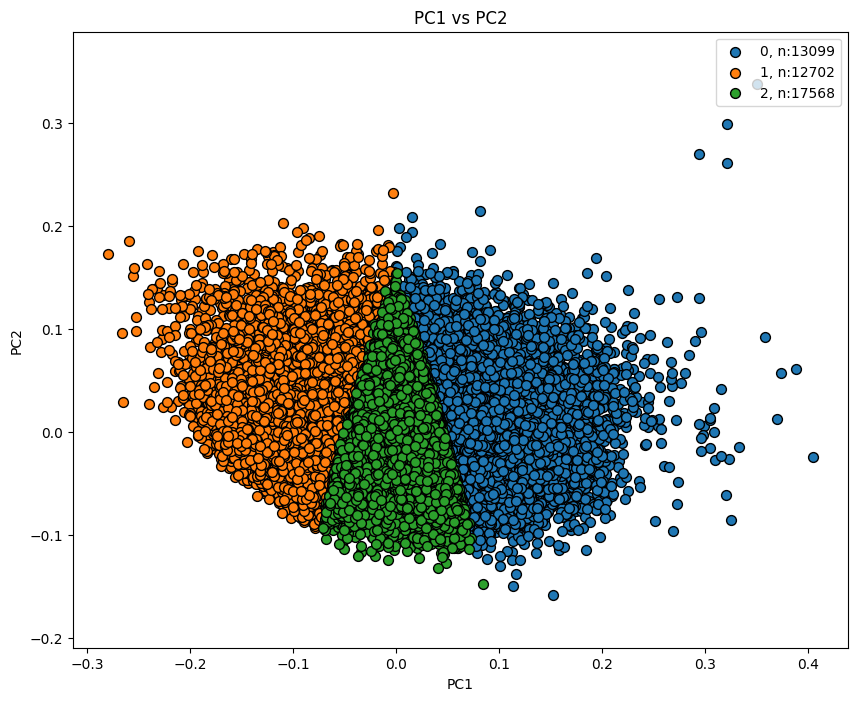


Plot all days


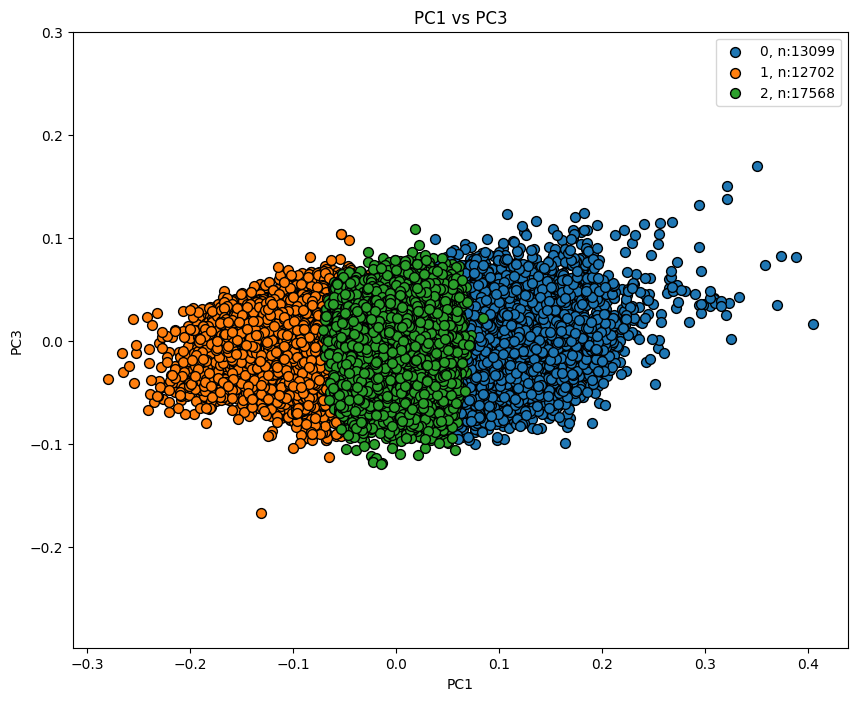


Plot all days


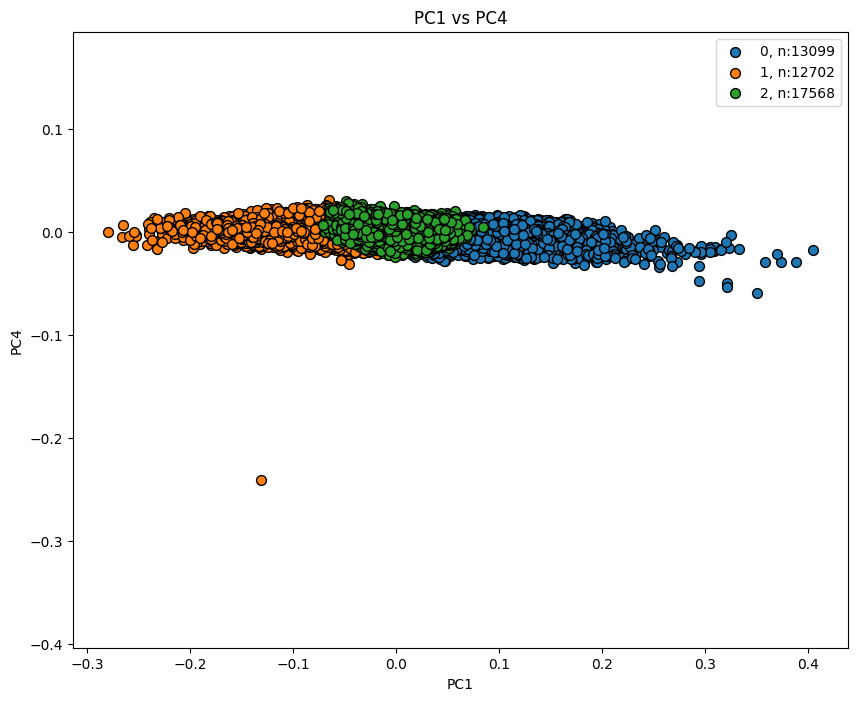


Plot all days


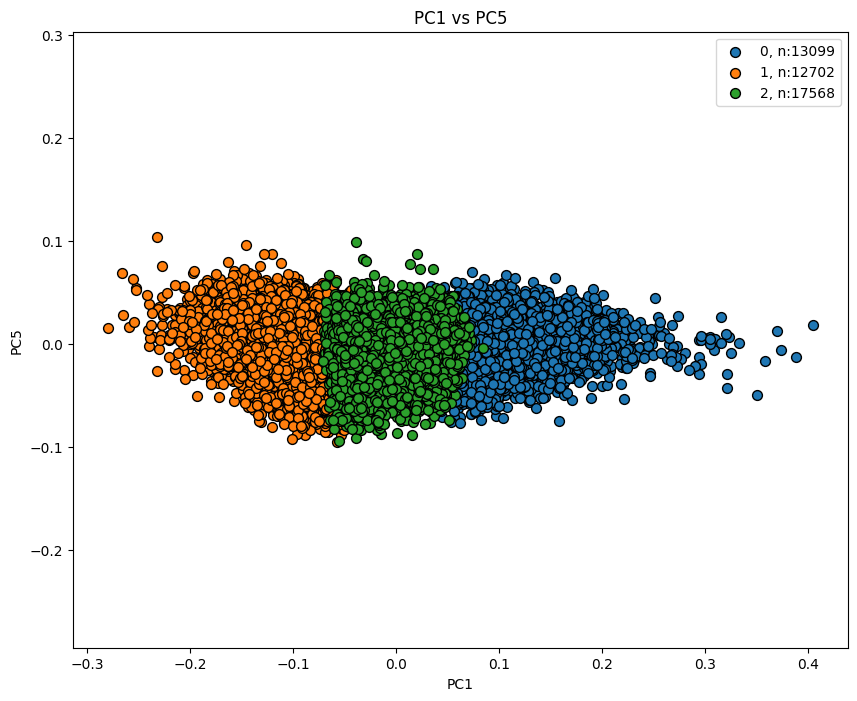


Plot all days


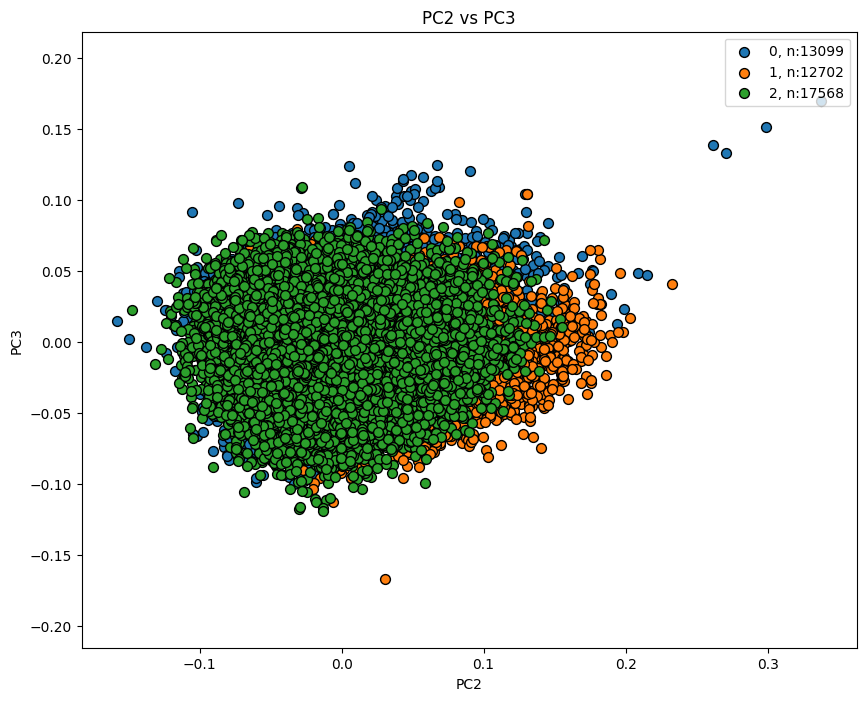


Plot all days


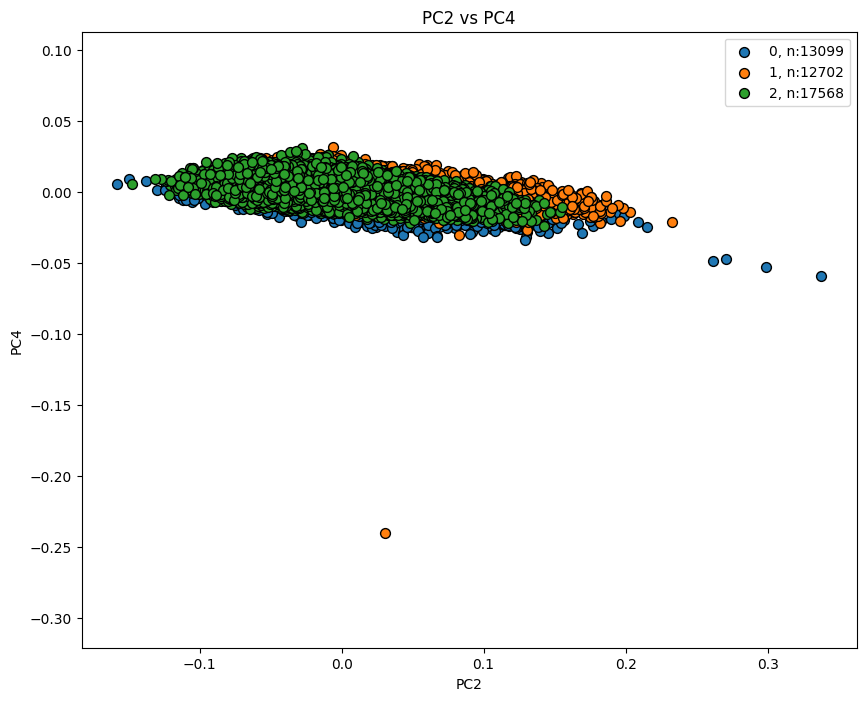


Plot all days


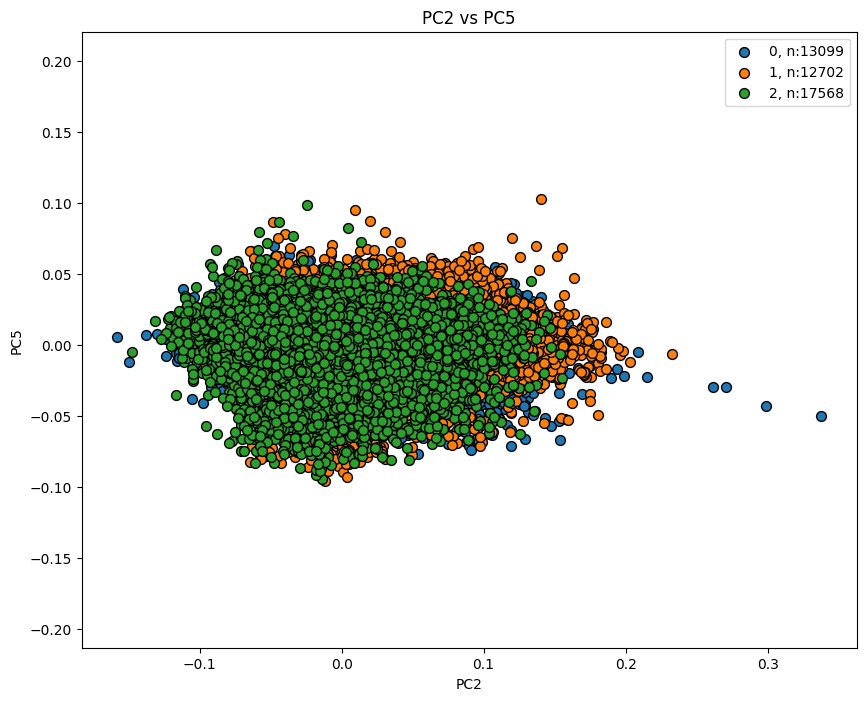


Plot all days


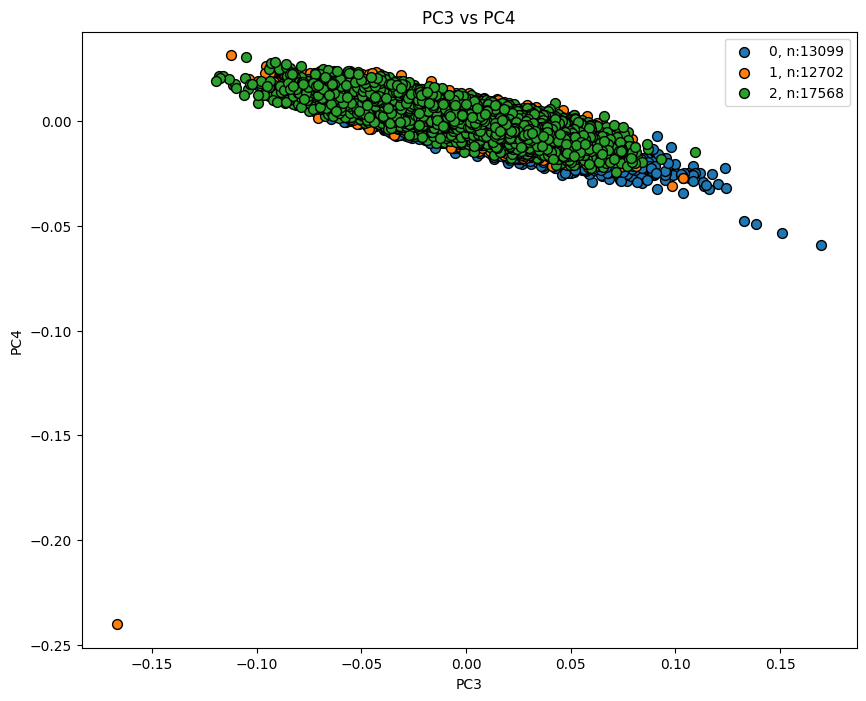


Plot all days


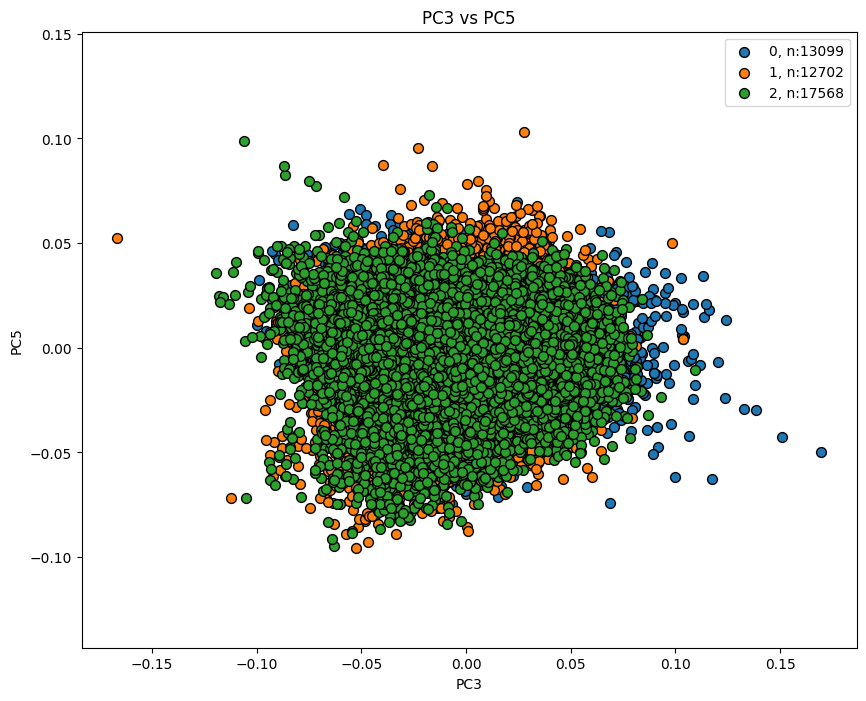


Plot all days


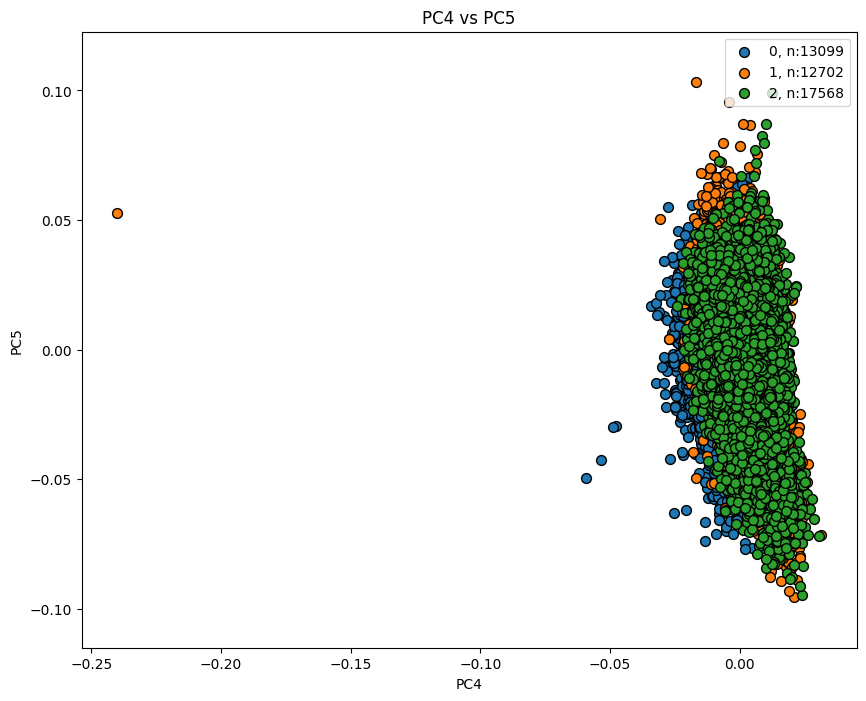

In [15]:
for pair in pc_pairs:
    visualize_lowdimensional_clusters(cfg,
                                      df_projected,
                                      x_col=pair[0],
                                      y_col=pair[1],
                                      color_cols=['cluster'],
                                      titles=[f'{pair[0]} vs {pair[1]}']
                                     )

In [16]:
grouped_df = groupBy_PM_Pair(cfg, df_projected)

In [17]:
print(grouped_df.head())

     short_key_  cluster_final  cluster_count          cluster_unique_values  \
0  /day28/RU016              0            249    [(0, 177), (2, 70), (1, 2)]   
1  /day28/RU018              1            197   [(1, 135), (2, 46), (0, 16)]   
2  /day28/RU022              2            395  [(2, 186), (1, 175), (0, 34)]   
3  /day28/RU039              2            173    [(2, 76), (1, 73), (0, 24)]   
4  /day28/RU040              0             84             [(0, 74), (2, 10)]   

        PC1       PC2       PC3       PC4       PC5  
0  0.072923  0.031367 -0.002537 -0.001995 -0.021364  
1 -0.074070 -0.006202 -0.000764  0.003637 -0.002437  
2 -0.039017 -0.028439  0.024637 -0.001369  0.008648  
3 -0.029625 -0.026144  0.033365 -0.002554 -0.005677  
4  0.079896  0.015864 -0.030607 -0.000972  0.024942  



Plot all days


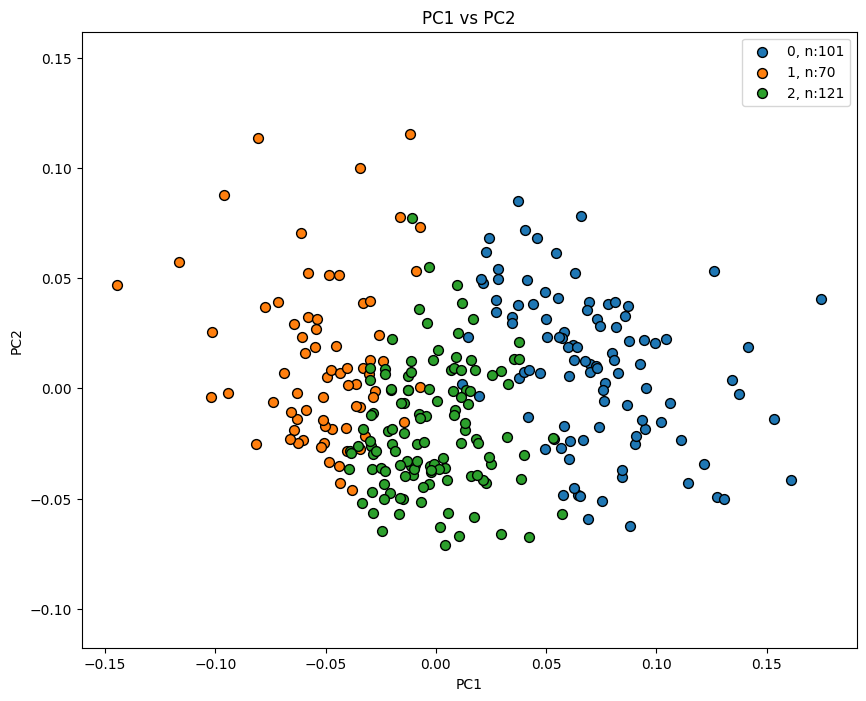


Plot all days


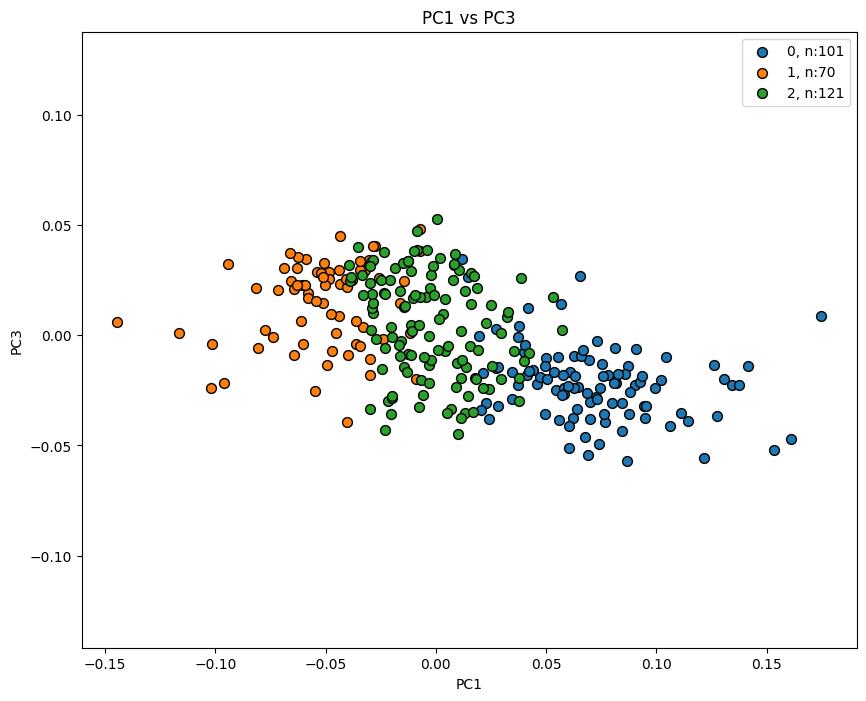


Plot all days


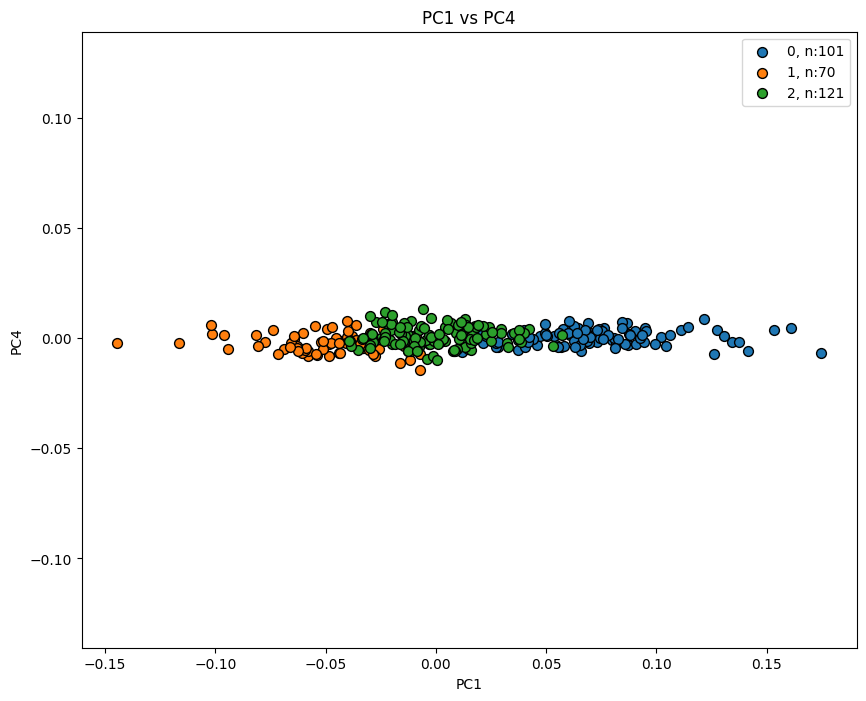


Plot all days


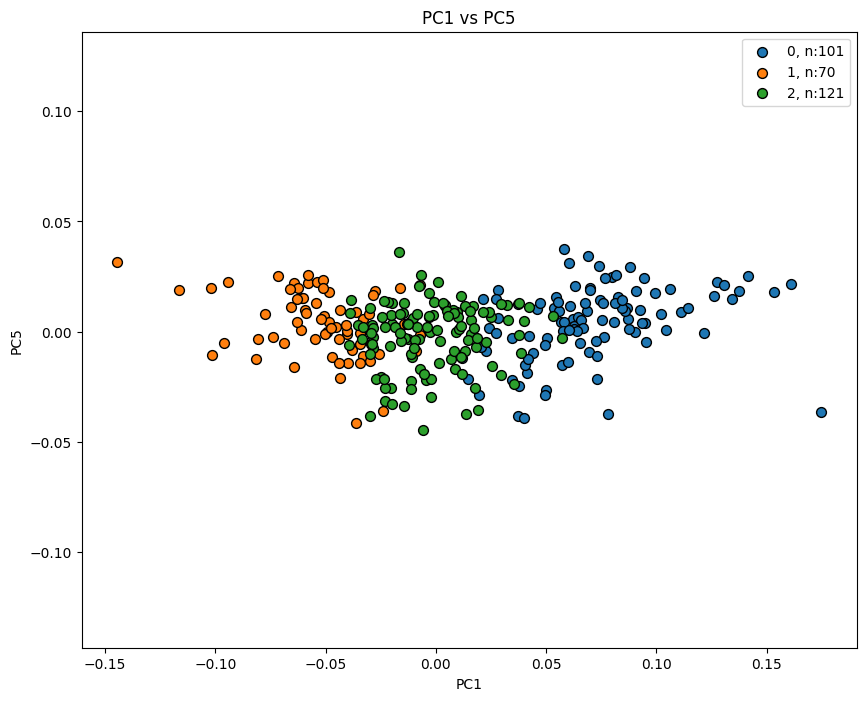


Plot all days


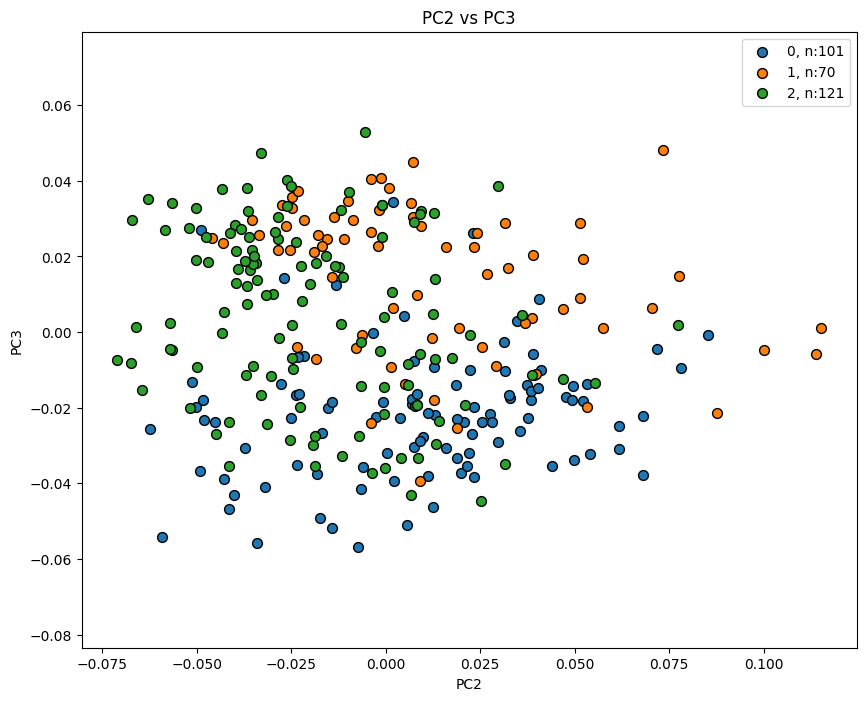


Plot all days


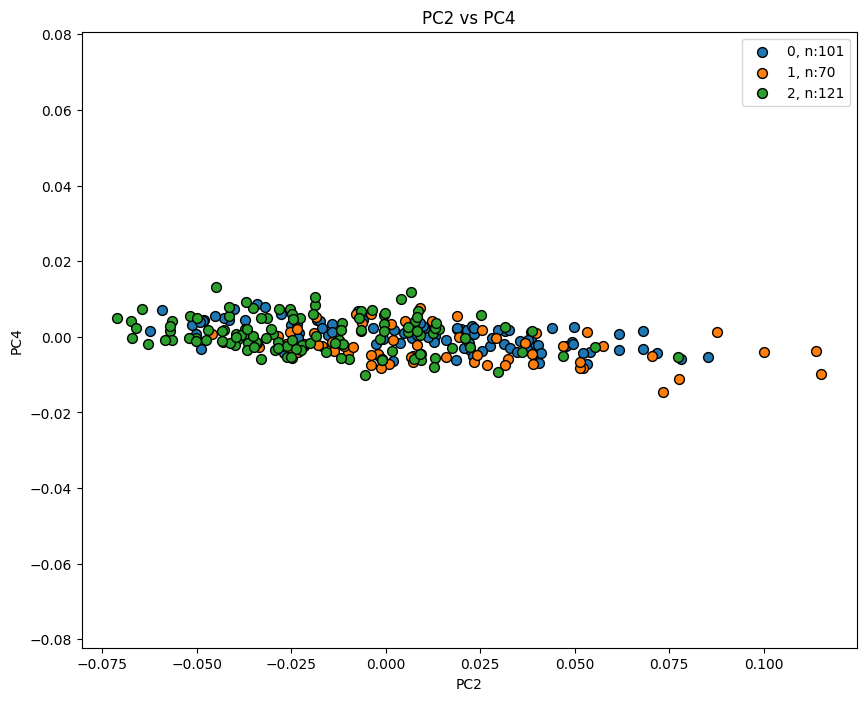


Plot all days


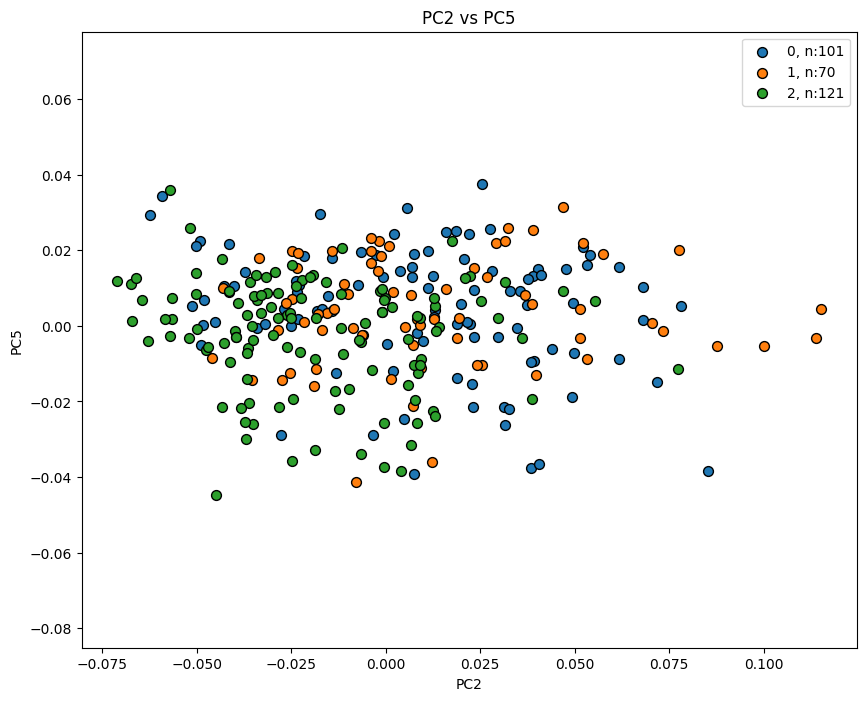


Plot all days


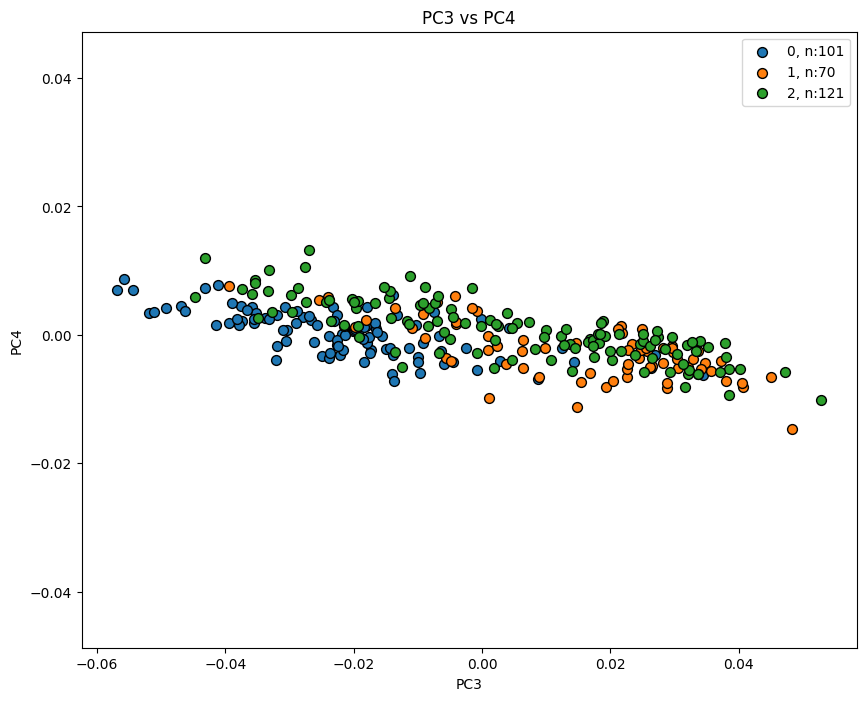


Plot all days


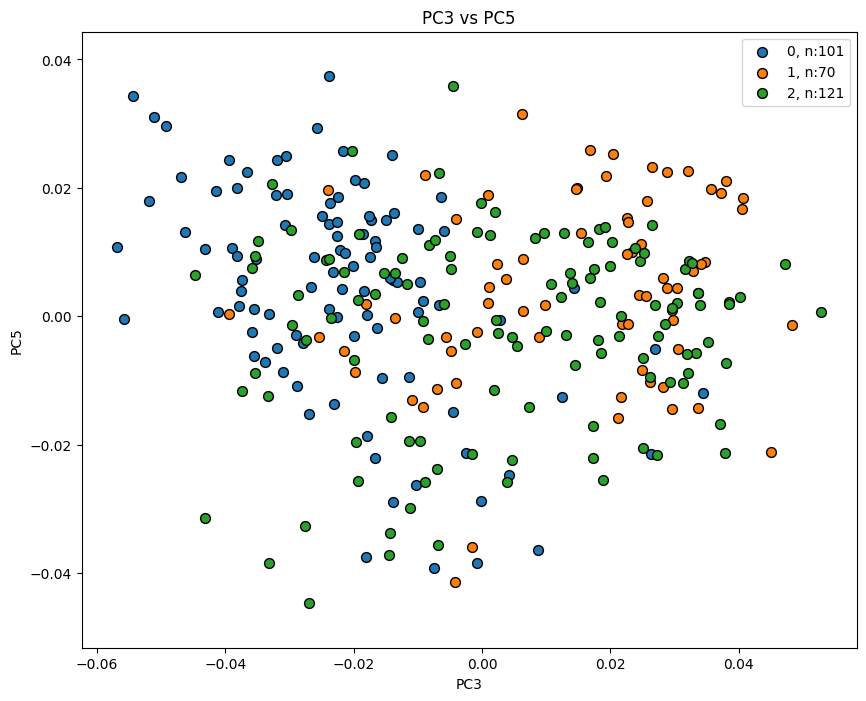


Plot all days


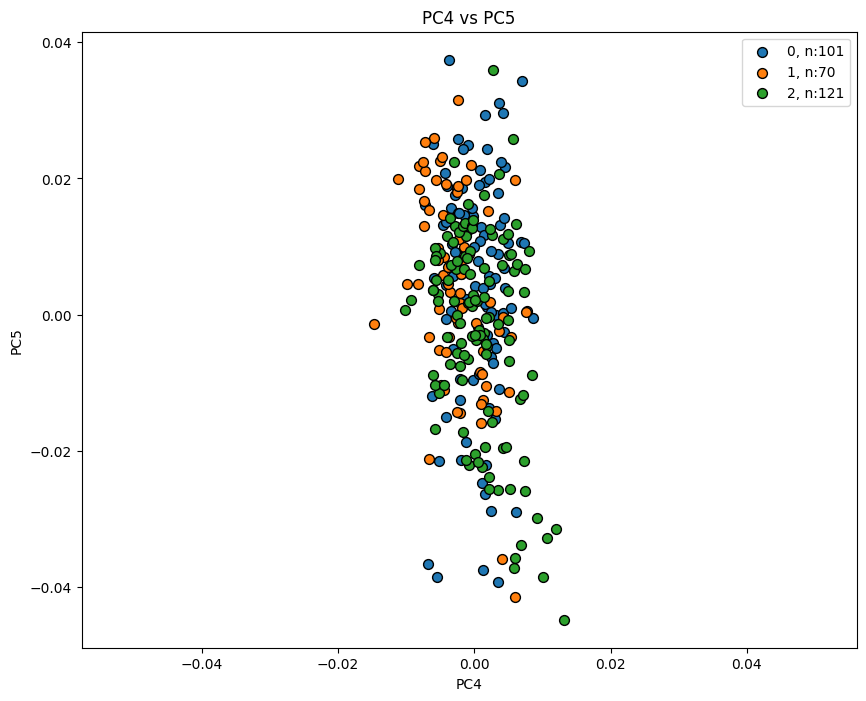

In [18]:
for pair in pc_pairs:
    visualize_lowdimensional_clusters(cfg,
                                      grouped_df,
                                      x_col=pair[0],
                                      y_col=pair[1],
                                      color_cols=['cluster_final'],
                                      titles=[f'{pair[0]} vs {pair[1]}']
                                     )

In [39]:
df_fma = getEmbeddingCompdf(cfg)

In [41]:
print(grouped_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   short_key_             292 non-null    object 
 1   cluster_final          292 non-null    int32  
 2   cluster_count          292 non-null    int64  
 3   cluster_unique_values  292 non-null    object 
 4   PC1                    292 non-null    float32
 5   PC2                    292 non-null    float32
 6   PC3                    292 non-null    float32
 7   PC4                    292 non-null    float32
 8   PC5                    292 non-null    float32
 9   Pat_id                 292 non-null    object 
 10  visit                  292 non-null    object 
dtypes: float32(5), int32(1), int64(1), object(4)
memory usage: 18.4+ KB
None


In [43]:
merged = merge_Embeddings_and_FMA(cfg, grouped_df, df_fma)

In [44]:
print(merged.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 73 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pat_id                    292 non-null    object 
 1   Pat_id_new                292 non-null    float64
 2   visit                     292 non-null    object 
 3   fma_ue_aff_total          292 non-null    float64
 4   age_x                     292 non-null    int64  
 5   dom_aff_x                 292 non-null    float64
 6   gender_x                  292 non-null    float64
 7   affected_side_x           292 non-null    object 
 8   Unnamed: 0                292 non-null    int64  
 9   index                     292 non-null    int64  
 10  day_visit                 292 non-null    float64
 11  age_y                     292 non-null    int64  
 12  gender_y                  86 non-null     float64
 13  dom_aff_y                 86 non-null     float64
 14  arat_aff_t


Plot all days


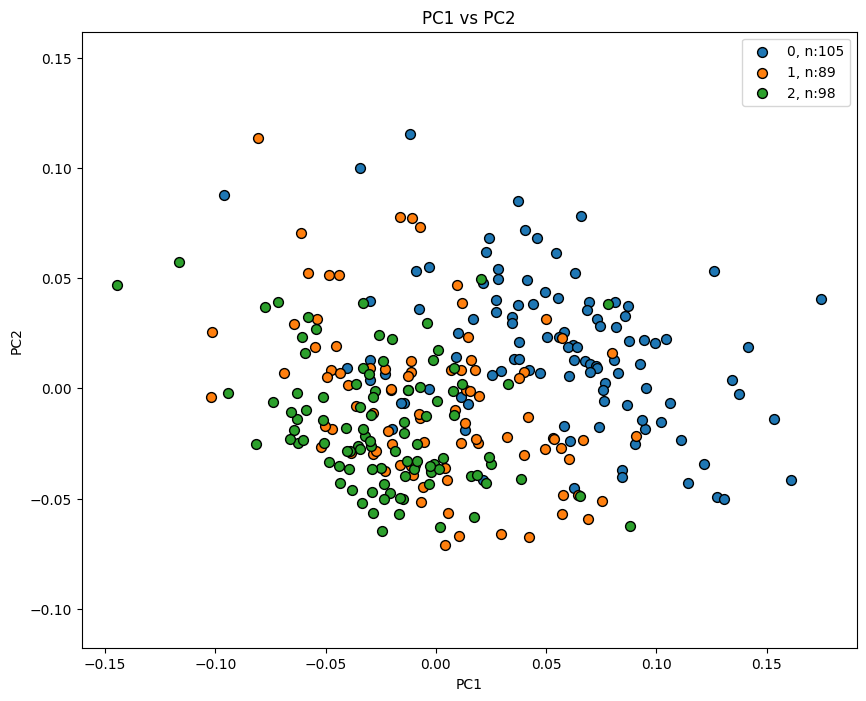


Plot all days


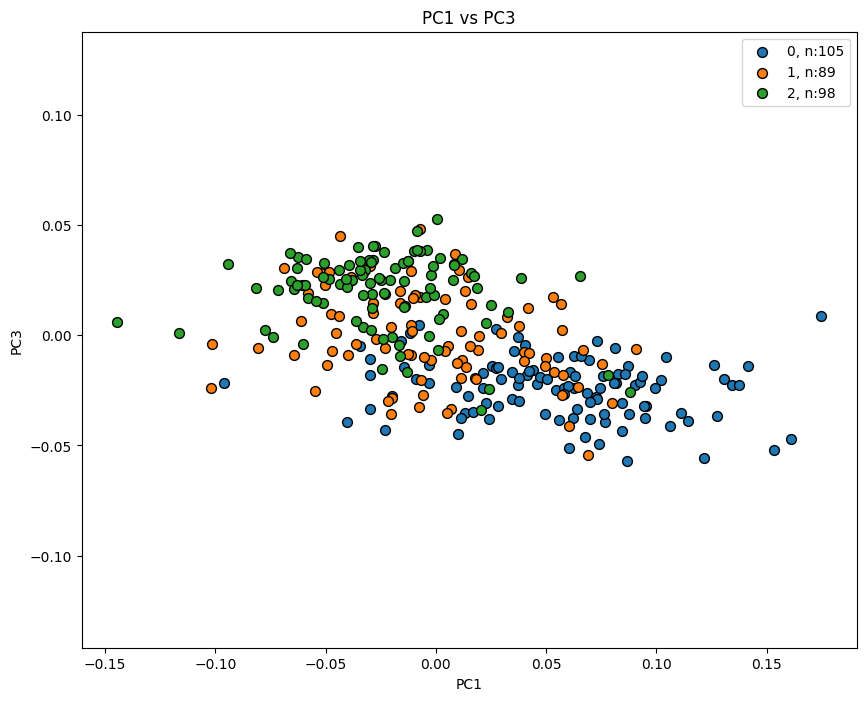


Plot all days


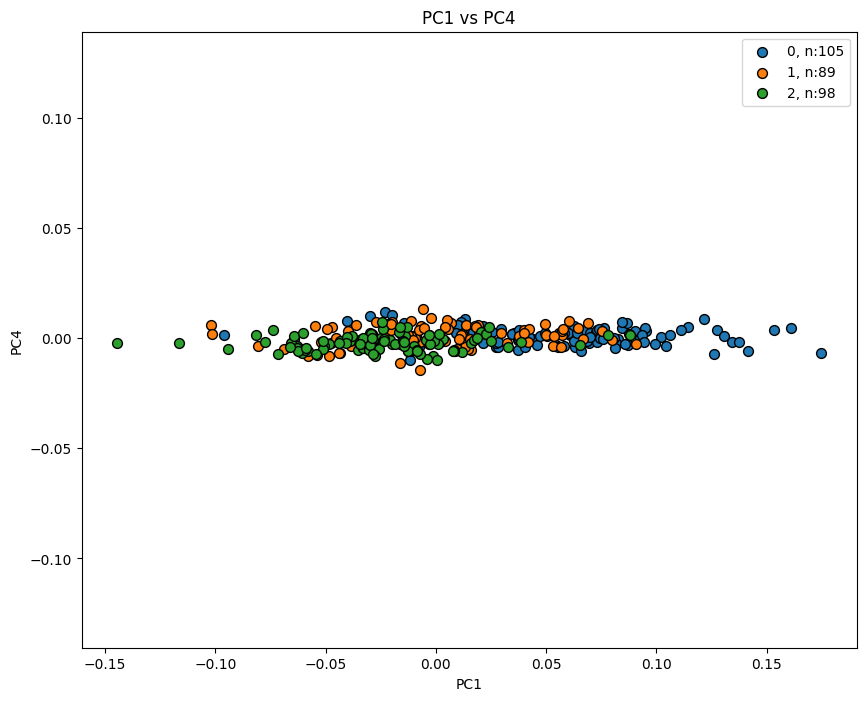


Plot all days


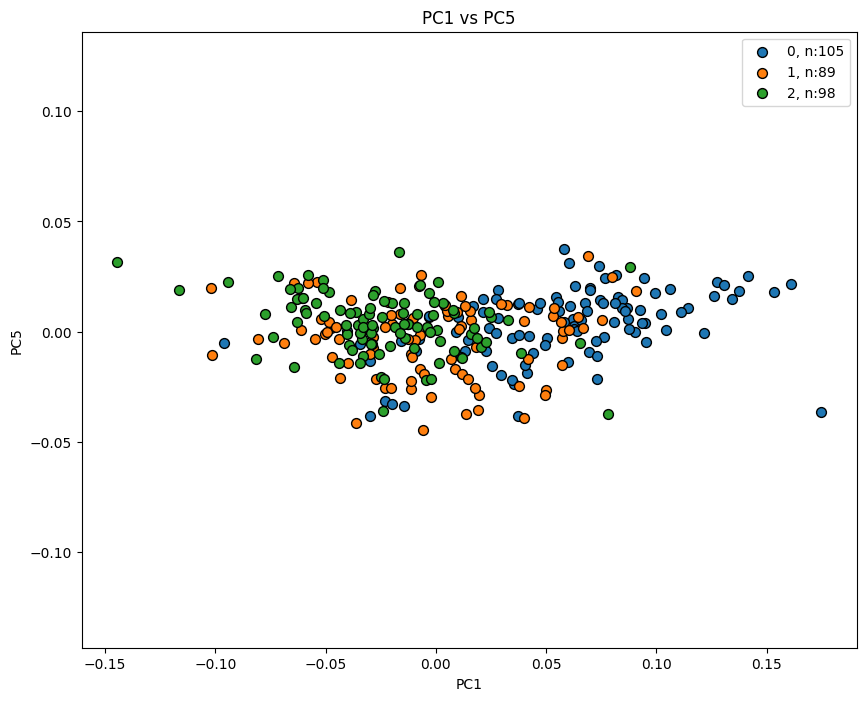


Plot all days


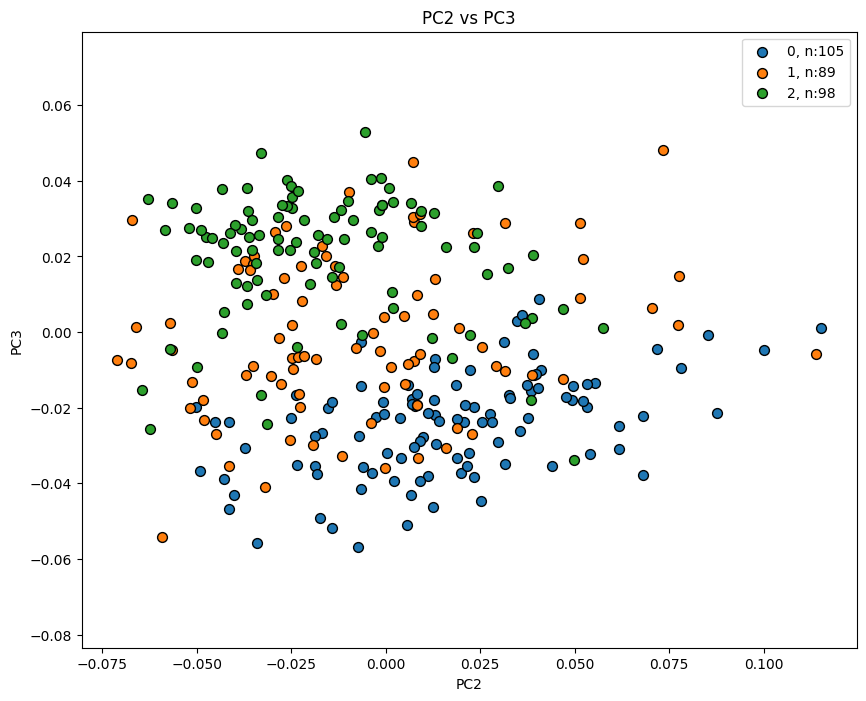


Plot all days


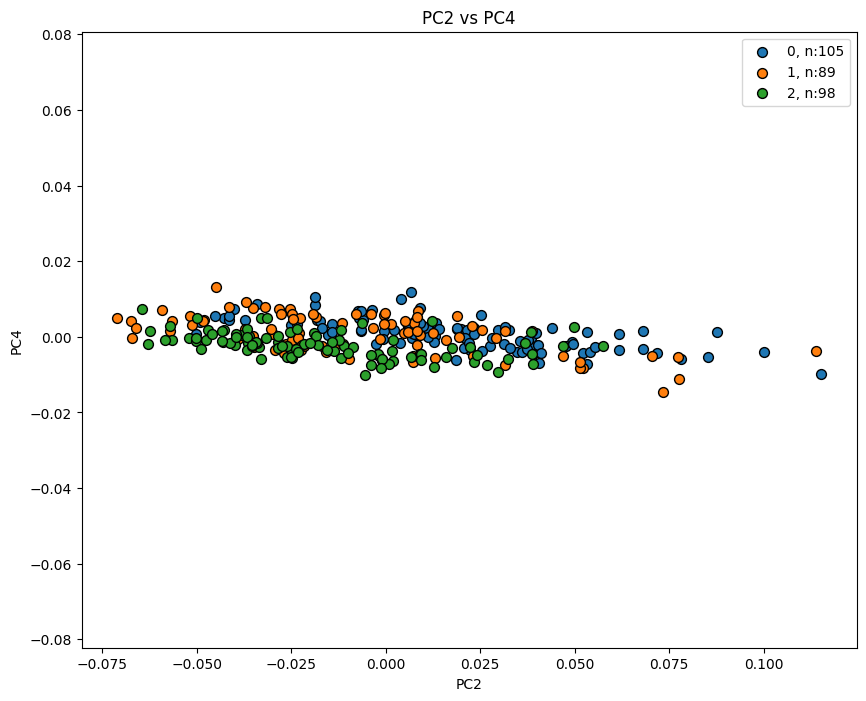


Plot all days


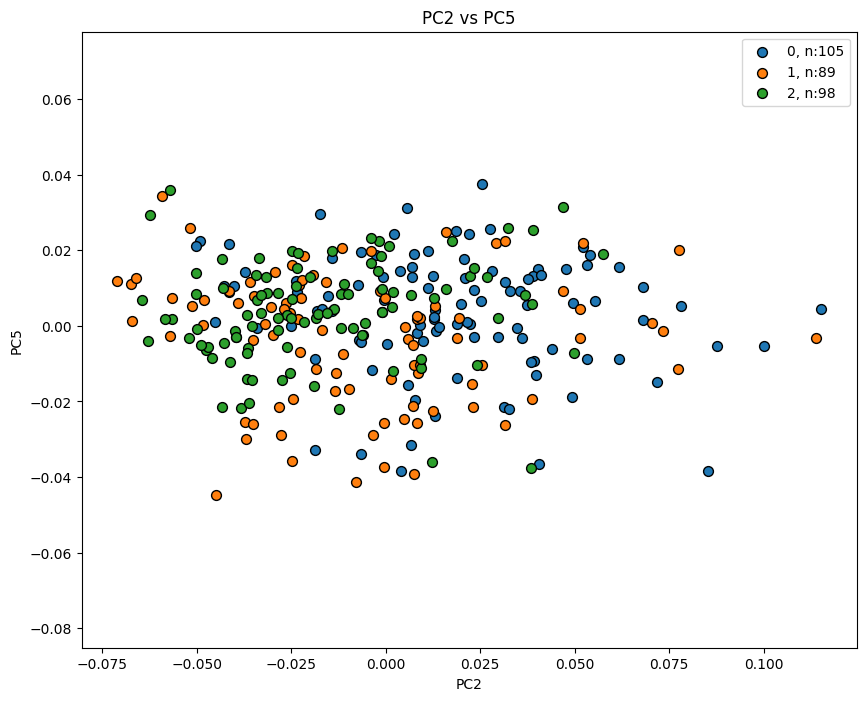


Plot all days


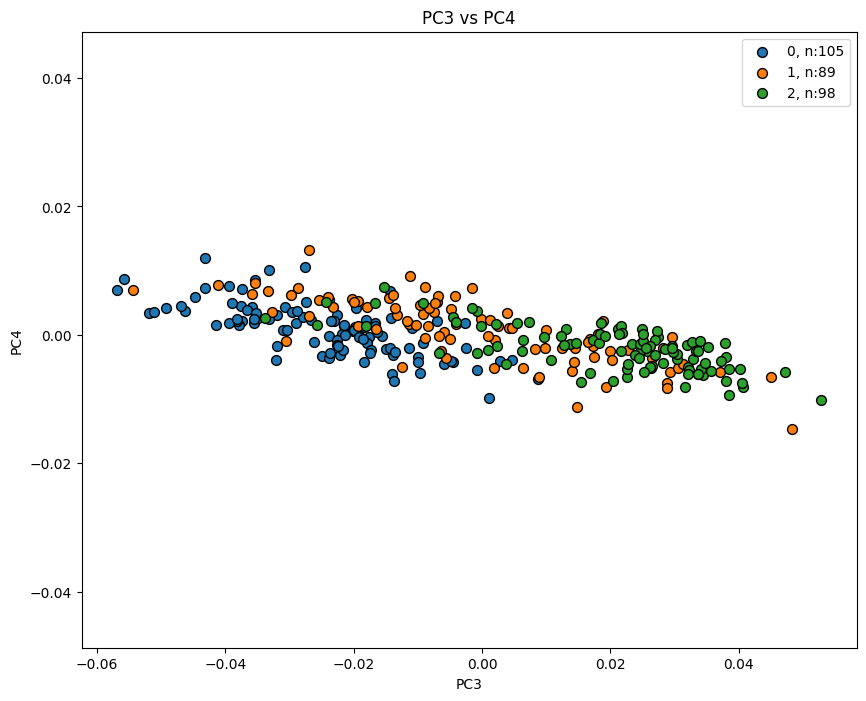


Plot all days


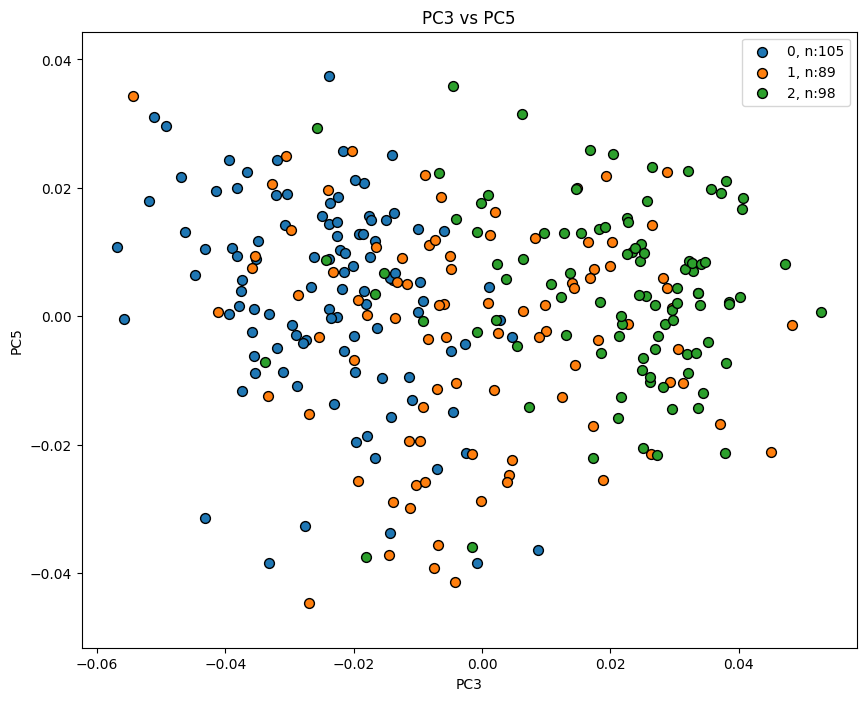


Plot all days


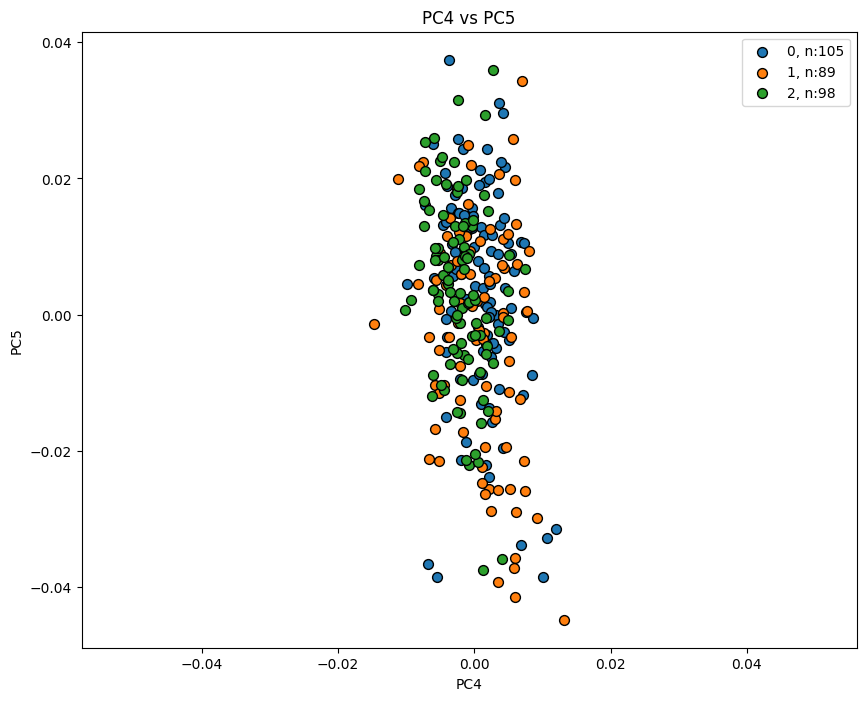

In [45]:
for pair in pc_pairs:
    visualize_lowdimensional_clusters(cfg,
                                      merged,
                                      x_col=pair[0],
                                      y_col=pair[1],
                                      color_cols=['cluster_fma'],
                                      titles=[f'{pair[0]} vs {pair[1]}']
                                     )

In [62]:
merged = matchClusters(cfg, merged, 'cluster_final', 'cluster_fma')

Best Cluster Matching: [(0, 0), (1, 1), (2, 2)]


Adjusted Rand Index (ARI): 0.21333491968309087
Normalized Mutual Information (NMI): 0.20877612858771194
Cluster Accuracy: 0.5753
Confusion Matrix:


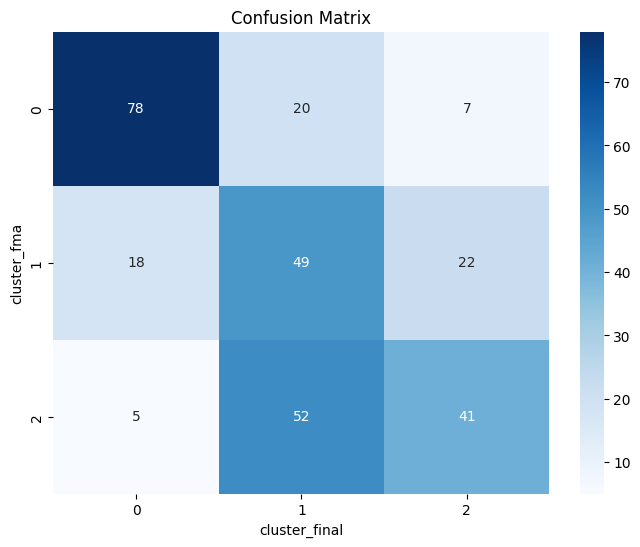

In [63]:
compareClusterings(cfg, merged, 'cluster_final', 'cluster_fma')

## Plots for Thesis

### One arm solution

[rank: 0] Seed set to 42
Generating embeddings: 100%|███████████████| 678/678 [04:51<00:00,  2.33batch/s]


Best Cluster Matching: [(0, 0), (1, 1), (2, 2)]
Adjusted Rand Index (ARI): 0.016738314671682235
Normalized Mutual Information (NMI): 0.05926704891013616
Cluster Accuracy: 0.3904
Confusion Matrix:


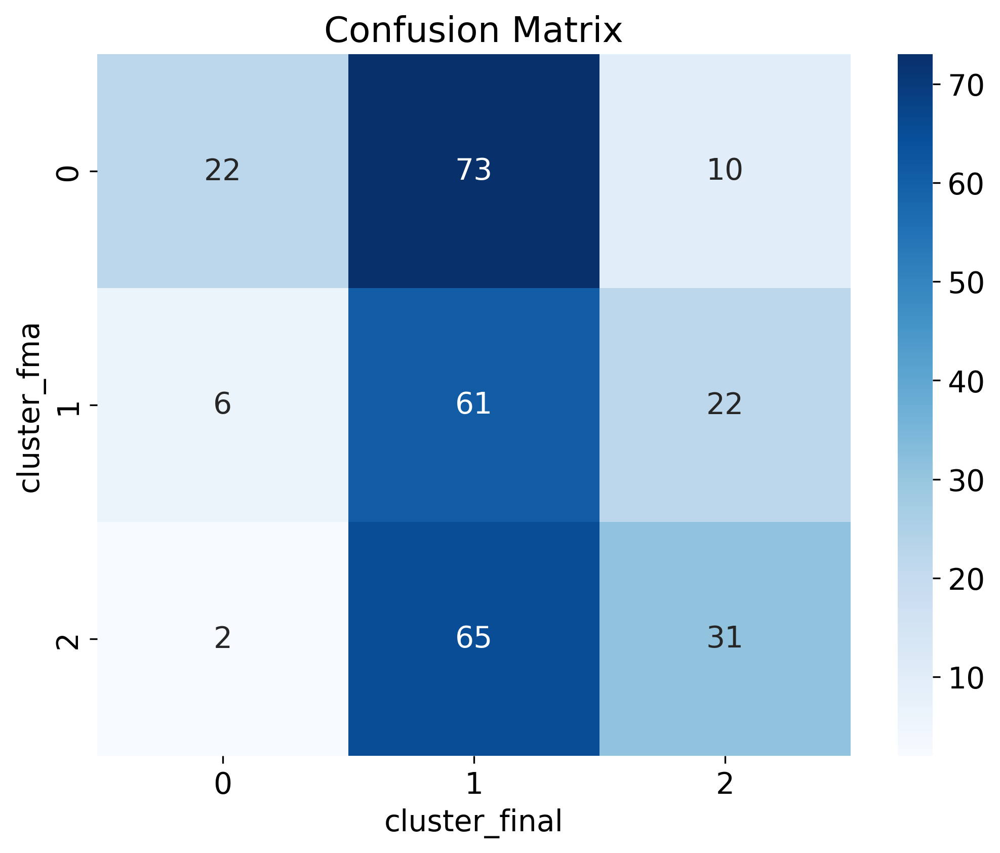


Plot all days


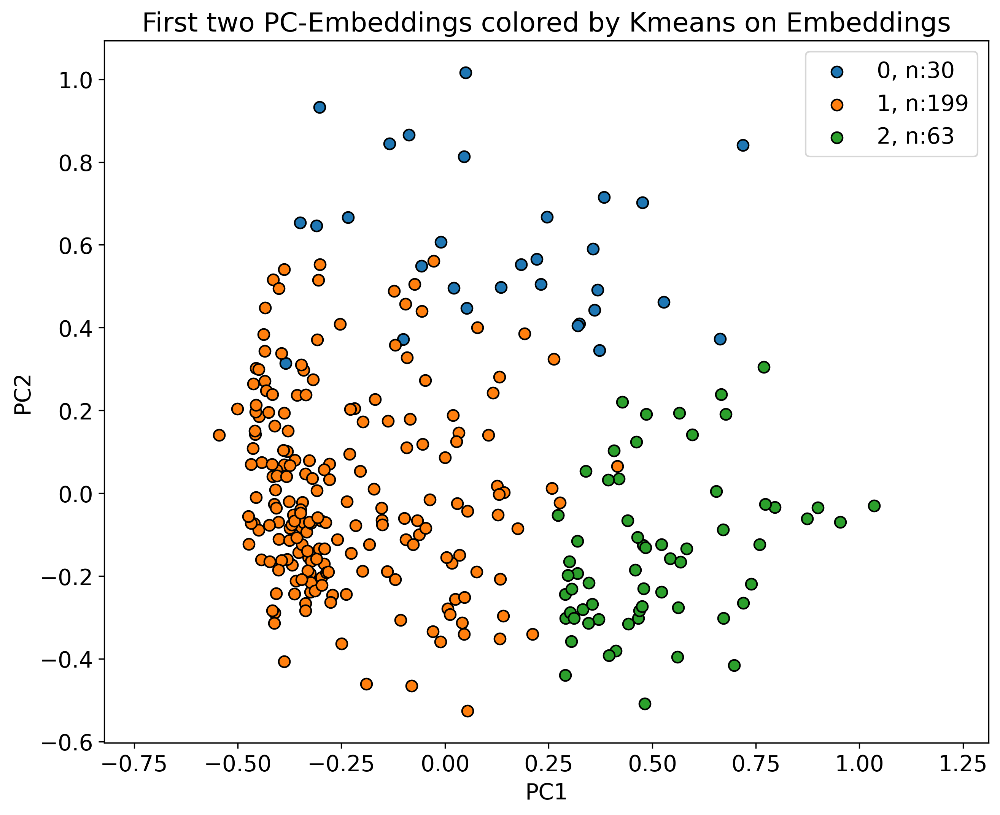

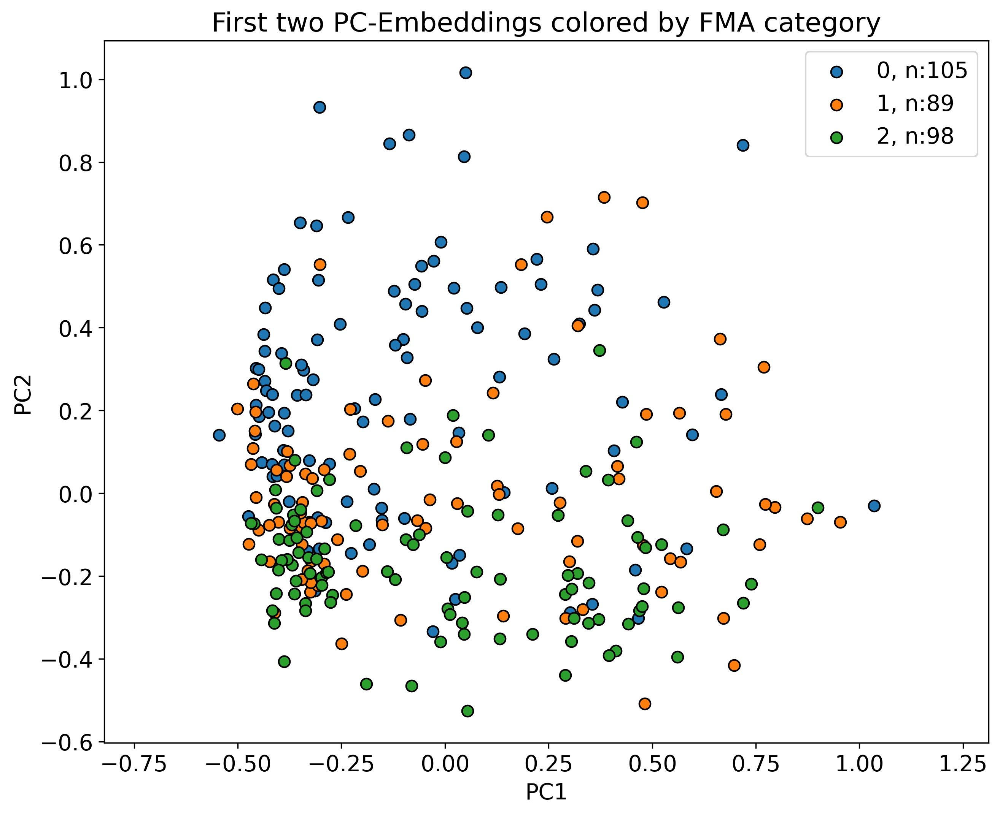

In [93]:
cfg.checkpoint_path =  '/cluster/work/vogtlab/Group/jamoser/checkpoints/w15m_th0.1/hyperparam_search/h032_p064_l02/lr1.0e-03_b128/wd1.0e-06_dr0.30_t0.07/noise0.20_mask0.15/20241204_215111/best_checkpoint.ckpt'

df, df_grouped, df_merged = embeddingPipeline(cfg)


Plot all days


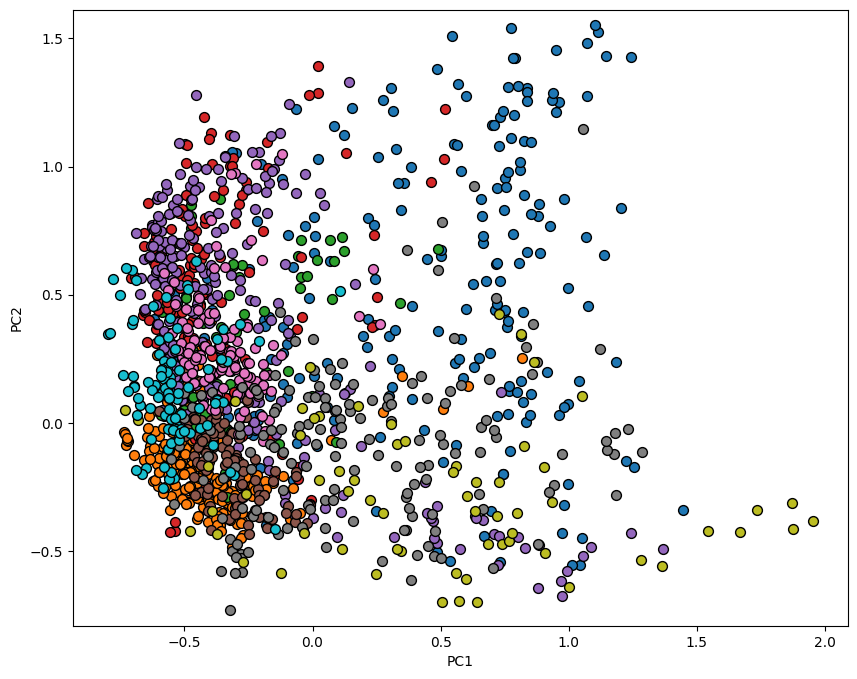

In [44]:
visualize_lowdimensional_clusters(cfg, df_subset, x_col='PC1', y_col='PC2', color_cols=['short_key'])


Plot all days


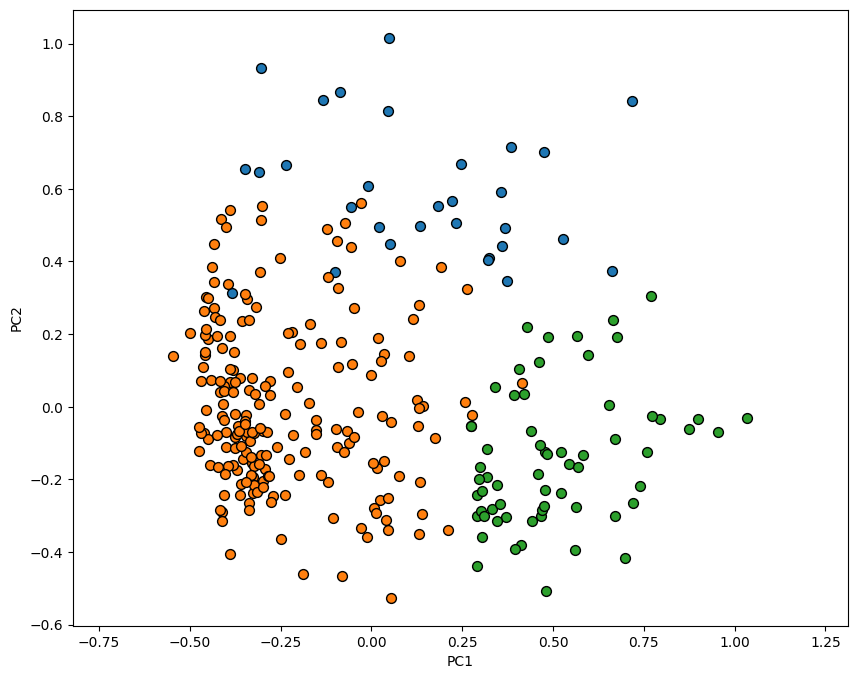

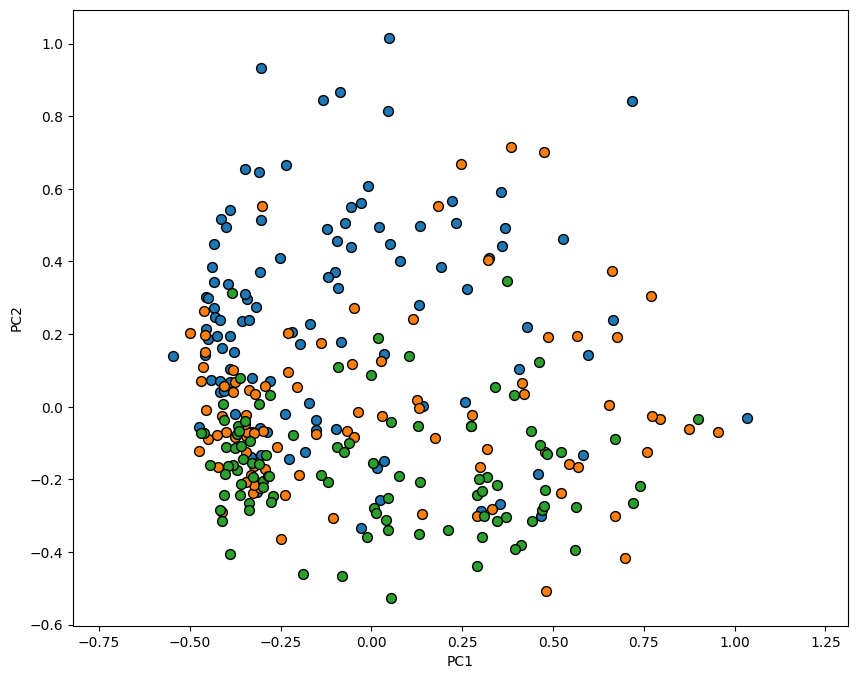

In [45]:
visualize_lowdimensional_clusters(cfg,
                                      df_merged,
                                      x_col='PC1',
                                      y_col='PC2',
                                      color_cols=['cluster_final', 'cluster_fma'],
                                      titles=['Averaged Measurement Embedding, colored by K-Means Clustering','Averaged Measurement Embedding, colored by Clinical FMA Clustering']#First two PC-Embeddings colored by FMA category']
                                     )

### Final solution

In [5]:
from src.clustering.embeddings import embeddingPipeline
import matplotlib.pyplot as plt
plt.rcParams['font.size'] = 14  # Adjust the number as needed
plt.rcParams['figure.dpi'] = 300

In [6]:
import os  # For file and directory management
import numpy as np  # For numerical operations
import pandas as pd  # For working with DataFrames
import matplotlib.pyplot as plt  # For plotting
import seaborn as sns  # For advanced visualizations
from scipy.optimize import linear_sum_assignment  # For the Hungarian algorithm
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score  # For clustering evaluation metrics

In [7]:
def visualize_lowdimensional_clusters(cfg, 
                                    df: pd.DataFrame,
                                    x_col: str = 'PC1', 
                                    y_col: str = 'PC2',
                                    color_cols: list = ['cluster'],
                                    plot_days: list = None,
                                    titles: list = None) -> None:
    """
    Creates scatter plots of low-dimensional data, with one subplot for each color column.
    Can either display plots or save them to a specified directory.

    Args:
    - df (pd.DataFrame): DataFrame containing the data
    - cfg: Configuration object containing save settings
    - x_col (str): Column name for x-axis
    - y_col (str): Column name for y-axis
    - color_cols (list): List of column names to use for coloring points
    - plot_days (list): If specified, filters data to these days
    - titles (list): Optional list of titles for each subplot. If None, uses color_col names
    """
    # Filter by days if specified
    if plot_days:
        df = df[df['visit'].isin(plot_days)]
        print(f'\nPlot days {plot_days}')
    else:
        print(f'\nPlot all days')

    # Use provided titles or default to color_cols names
    if titles is None:
        titles = color_cols

    # Determine if saving plots
    save_plots = hasattr(cfg, 'save_directory') and cfg.save_directory is not None
    
    for color_col, title in zip(color_cols, titles):
        # Create new figure for each plot
        plt.figure(figsize=(7, 6))
        
        # Create scatter plot
        unique_values = sorted(df[color_col].unique())
        for value in unique_values:
            mask = df[color_col] == value
            count = mask.sum()
            #label = 'Female' if value == 1 else 'Male' if value == 0 else str(value).capitalize() 
            #label = 'True' if value == 1 else 'False' if value == 0 else value.capitalize()
            label = value
            # label = 'Low' if value == 0 else 'Medium' if value == 1 else 'High'
            plt.scatter(df.loc[mask, x_col], 
                       df.loc[mask, y_col], 
                       label=label,#f'{value}, n:{count}',
                       edgecolor='k',
                       s=50)

        # Set labels and title
        plt.xlabel(x_col)
        plt.ylabel(y_col)
        plt.title(title)
        # plt.legend(loc='upper right')
        plt.axis('equal')
        plt.tight_layout()
        if save_plots:
            # Create filename from title
            filename = f"{title.lower().replace(' ', '_')}.png"
            save_path = os.path.join(cfg.save_directory, filename)
            # Ensure directory exists
            os.makedirs(cfg.save_directory, exist_ok=True)
            plt.savefig(save_path)
            plt.close()
        else:
            plt.savefig(f'/cluster/home/jamoser/plots/representations_dl_{color_col}_new_strat.png')
            plt.show()

In [91]:
def plot_confusion_matrix(crosstab):
    """
    Plot the confusion matrix calculated using pd.crosstab.
    If save_path is provided, save the plot as an image, otherwise plot to the output.
    
    Args:
        crosstab (pd.DataFrame): The confusion matrix calculated using pd.crosstab.
        save_path (str or None): Path to save the image. If None, the plot is displayed.
    """
    plt.figure(figsize=(6, 6))
    ax = sns.heatmap(crosstab, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title('Confusion Matrix:Deep Learning vs. Clinical Clustering')
    plt.ylabel('Clinical Clustering')#crosstab.index.name or 'Actual')
    plt.xlabel('Deep Learning Clustering')#crosstab.columns.name or 'Predicted')
    ax.set_aspect("equal")
    plt.tight_layout()
    plt.savefig('/cluster/home/jamoser/plots/confusion_dl.png')
    plt.show()

def matchClusters(cfg, df, novel_col, target_col):
    # Extract the true and predicted labels
    y_true = df[target_col].to_numpy()
    y_pred = df[novel_col].to_numpy()
    
    # Create the cost matrix for the Hungarian algorithm
    cost_matrix = np.zeros((len(set(y_true)), len(set(y_pred))))
    
    for i, valid_cluster in enumerate(set(y_true)):
        for j, novel_cluster in enumerate(set(y_pred)):
            cost_matrix[i, j] = -np.sum((y_true == valid_cluster) & (y_pred == novel_cluster))
    
    # Use the Hungarian algorithm to find the best cluster matching
    row_ind, col_ind = linear_sum_assignment(cost_matrix)
    matched_clusters = list(zip(row_ind, col_ind))
    
    # Reorder the predicted labels according to the best matching
    y_pred_reordered = np.zeros_like(y_pred)
    for i, j in zip(row_ind, col_ind):
        y_pred_reordered[y_pred == j] = i
    
    # Update the dataset with the reassigned cluster labels
    df[novel_col] = y_pred_reordered
    print(f"Best Cluster Matching: {matched_clusters}")
    return df

def compareClusterings(cfg, df, x_col, y_col):
    # Extract the true and predicted labels
    scores_x = df[x_col].to_numpy()
    scores_y = df[y_col].to_numpy()
    
    # Compute ARI and NMI
    ari_score = adjusted_rand_score(scores_x, scores_y)
    nmi_score = normalized_mutual_info_score(scores_x, scores_y)
    
    # Calculate the confusion matrix with the reordered predictions
    confusion = pd.crosstab(scores_y, scores_x, rownames=[y_col], colnames=[x_col])
    
    # Calculate Cluster Accuracy
    correct_assignments = np.sum(np.diag(confusion.values))
    total_assignments = np.sum(confusion.values)
    cluster_accuracy = correct_assignments / total_assignments

    # Print the results
    print(f"Adjusted Rand Index (ARI): {ari_score}")
    print(f"Normalized Mutual Information (NMI): {nmi_score}")
    print(f"Cluster Accuracy: {cluster_accuracy:.4f}")
    print("Confusion Matrix:")
    plot_confusion_matrix(confusion)

In [18]:
import random
random.seed(2)  # Replace 42 with any integer seed value for reproducibility

# Sample list
my_list = list(df['short_key'].unique())

# Randomly sample 10 elements
sampled_elements = random.sample(my_list, 10)

print(sampled_elements)
df_subset = df[df['short_key'].isin(sampled_elements)]
print(len(df))
print(len(df_subset))

['/day3/RU032', '/day3/RU053', '/day3/RU050', '/day90/RU017', '/day9/RU002', '/day9/RU085', '/day9/RU051', '/day9/RU026', '/day3/RU022', '/day3/RU089']
43369
1746


[rank: 0] Seed set to 42
Generating embeddings: 100%|███████████████| 678/678 [05:40<00:00,  1.99batch/s]


Best Cluster Matching: [(0, 0), (1, 1), (2, 2)]
Adjusted Rand Index (ARI): 0.1789256994754889
Normalized Mutual Information (NMI): 0.24494274843051522
Cluster Accuracy: 0.5240
Confusion Matrix:


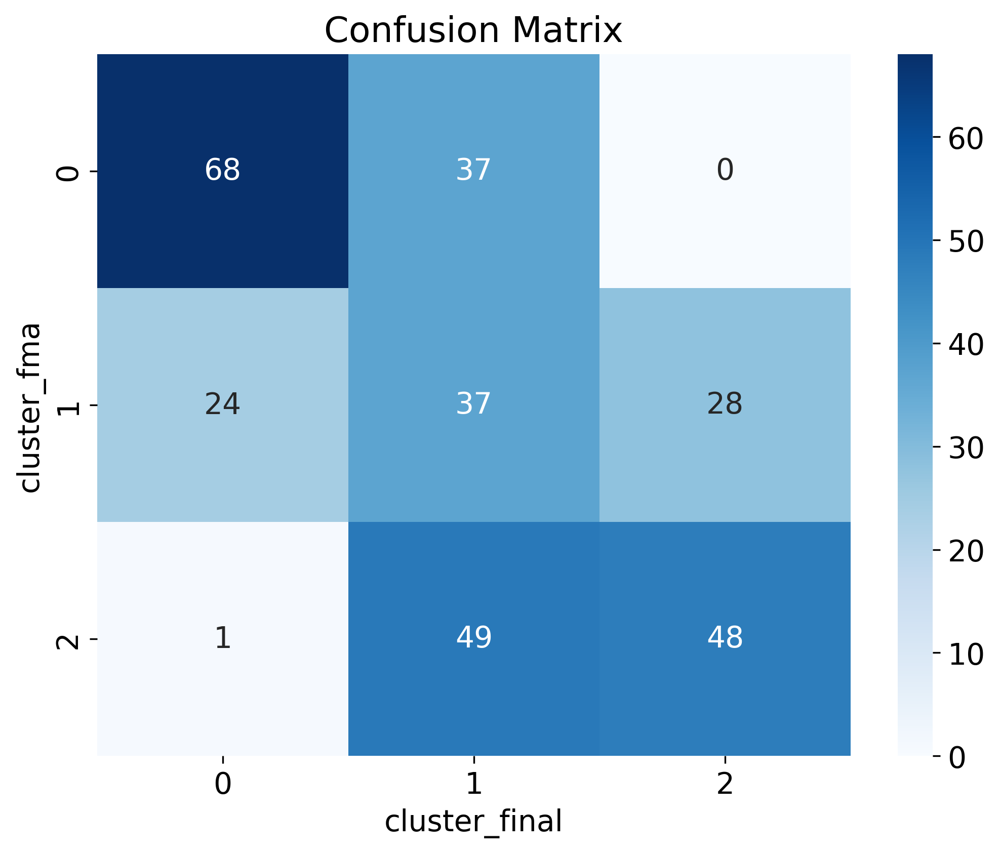


Plot all days


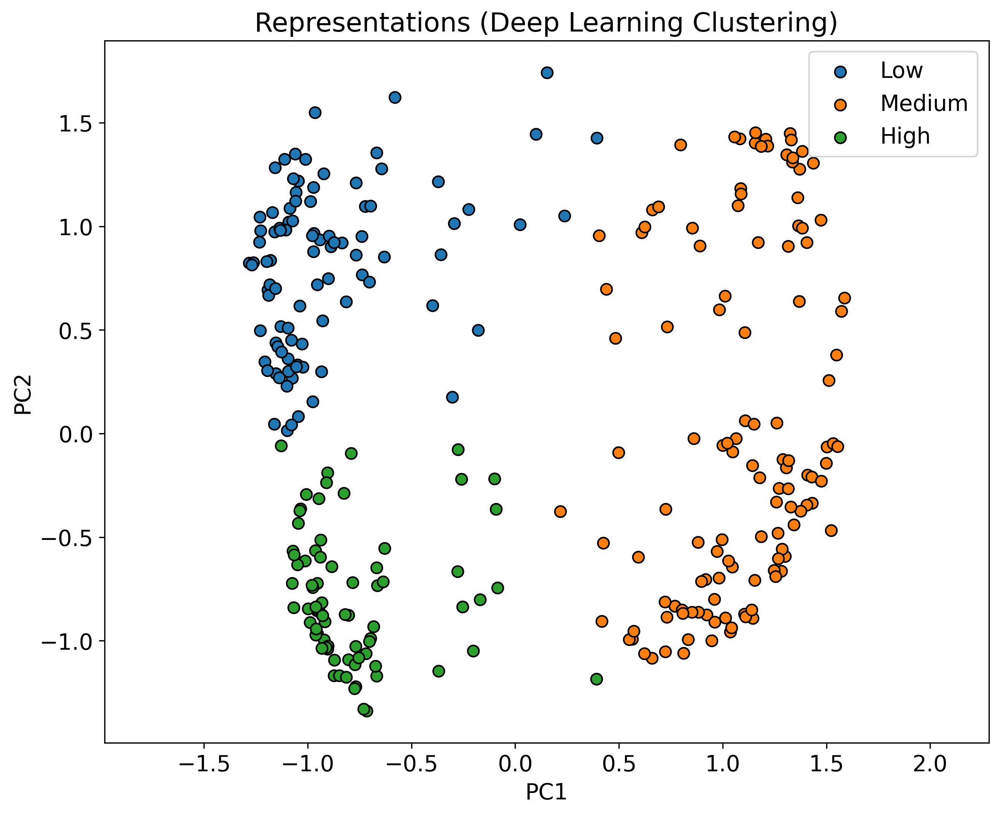

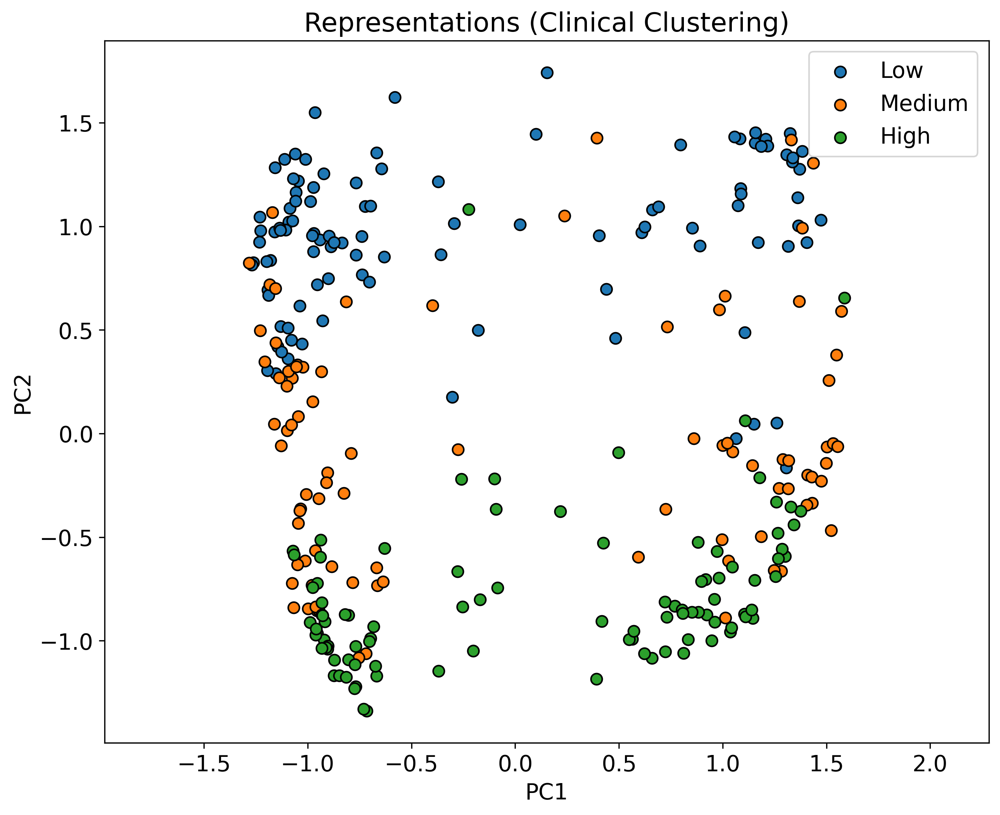

In [9]:
cfg.checkpoint_path =  '/cluster/work/vogtlab/Group/jamoser/checkpoints/w15m_th0.25/hyperparam_search/h032_p032_l03/lr1.0e-03_b064/wd1.0e-04_dr0.30_t0.07/noise0.10_mask0.30/20241219_124214/best_checkpoint.ckpt'

df, df_grouped, df_merged = embeddingPipeline(cfg)


Plot all days


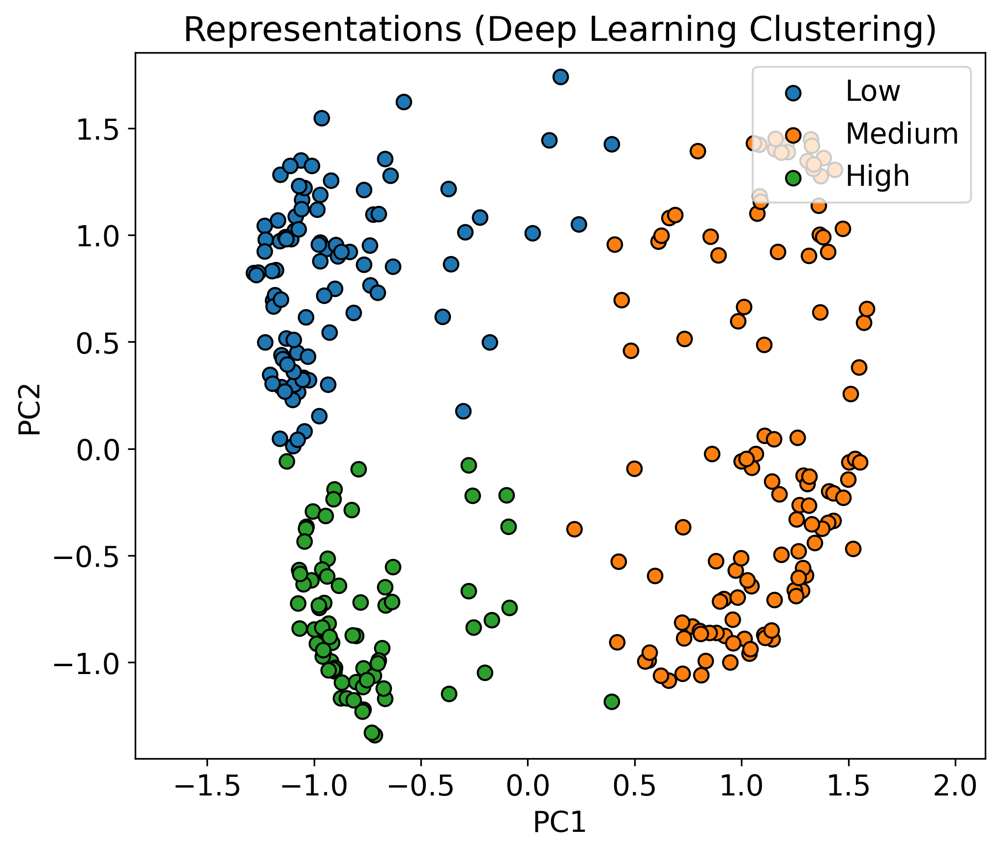

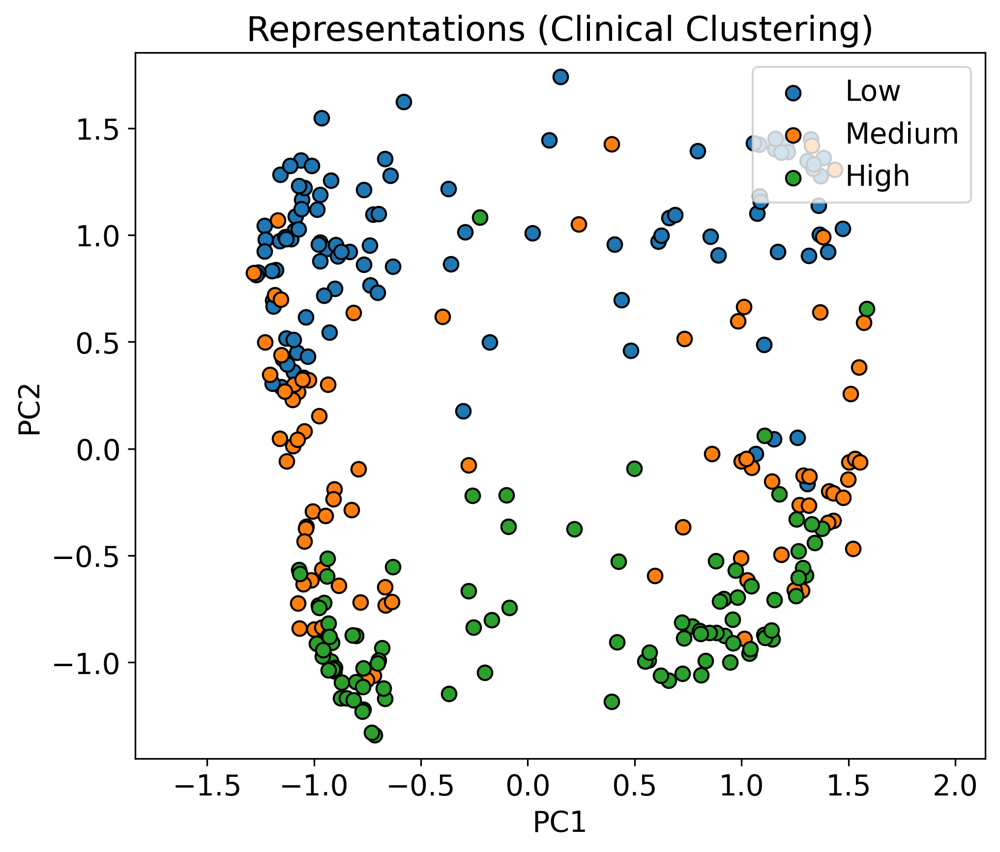

In [78]:
visualize_lowdimensional_clusters(cfg,
                                      df_merged,
                                      x_col='PC1',
                                      y_col='PC2',
                                      color_cols=['cluster_final', 'cluster_fma'],
                                      titles=['Representations (Deep Learning Clustering)', 'Representations (Clinical Clustering)']
                                 )

Adjusted Rand Index (ARI): 0.1789256994754889
Normalized Mutual Information (NMI): 0.24494274843051522
Cluster Accuracy: 0.5240
Confusion Matrix:


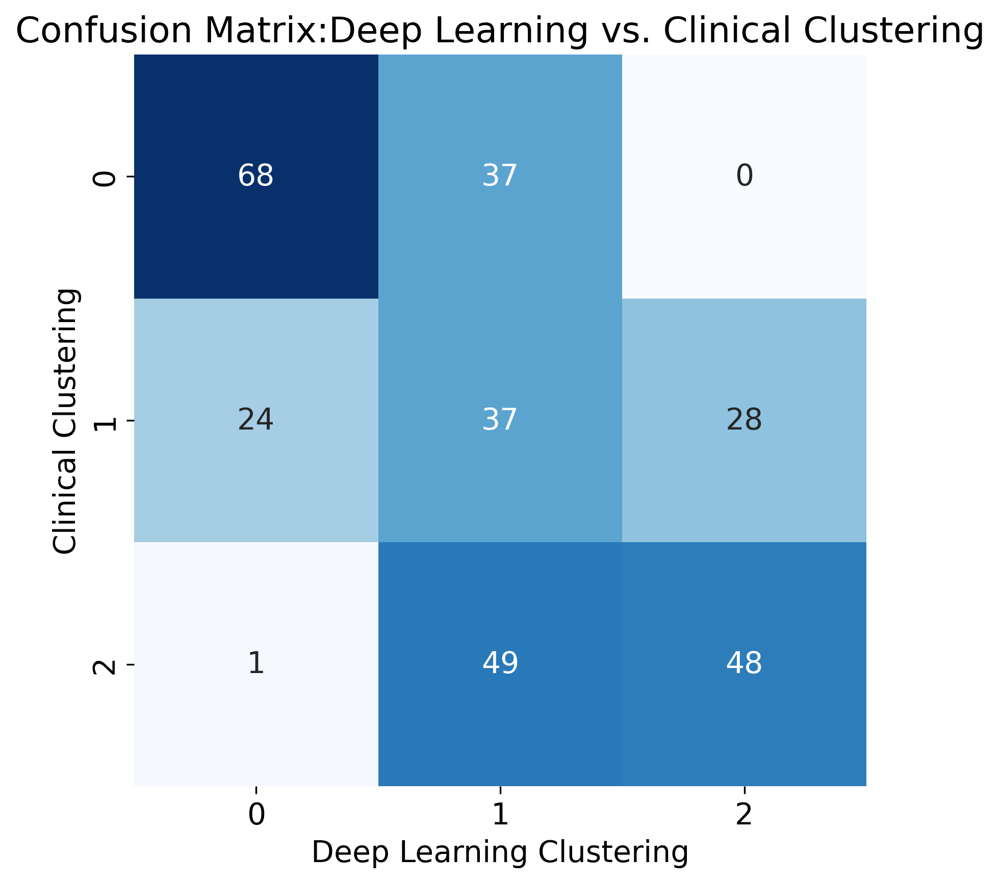

In [70]:
compareClusterings(cfg, df_merged, 'cluster_final', 'cluster_fma')

['/day9/RU010', '/day90/RU066', '/day90/RU046', '/day365/RU021', '/day90/RU019', '/day90/RU014', '/day90/RU018', '/day3/RU090', '/day90/RU038', '/day90/RU075']

Plot all days


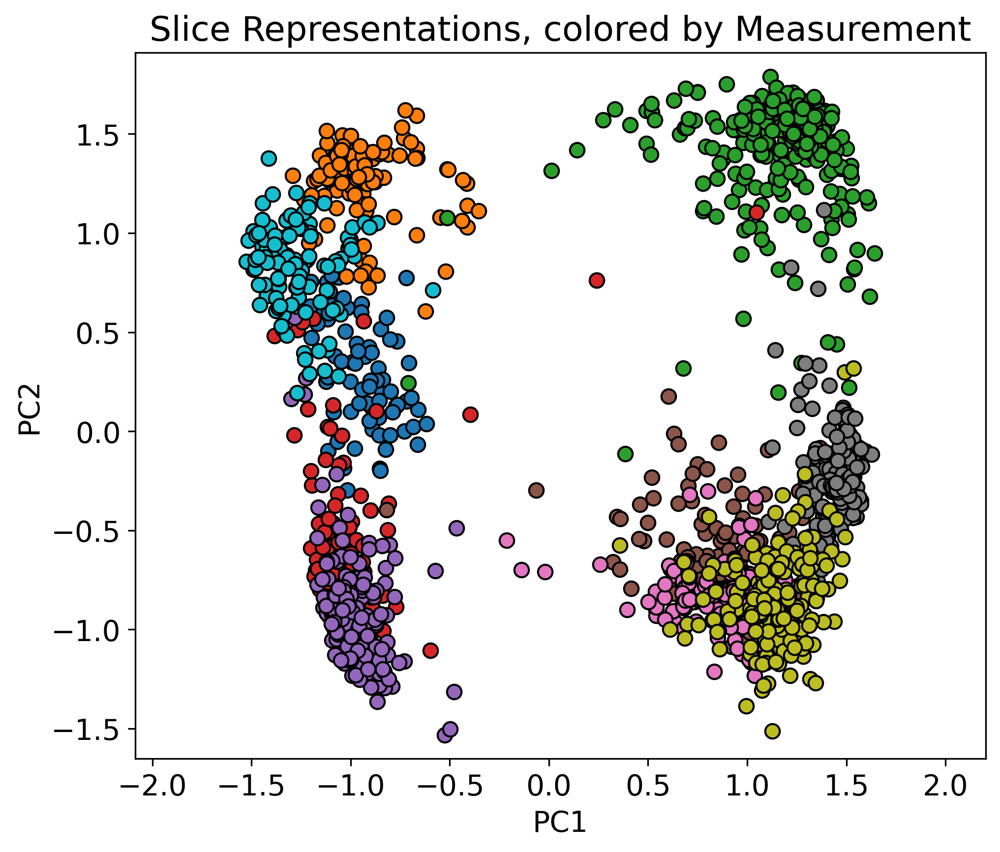

In [23]:
sampled_elements = random.sample(my_list, 10)

print(sampled_elements)
df_subset = df[df['short_key'].isin(sampled_elements)]
visualize_lowdimensional_clusters(cfg, df_subset, x_col='PC1', y_col='PC2', color_cols=['short_key'], titles=['Slice Representations, colored by Measurement'])


Plot all days


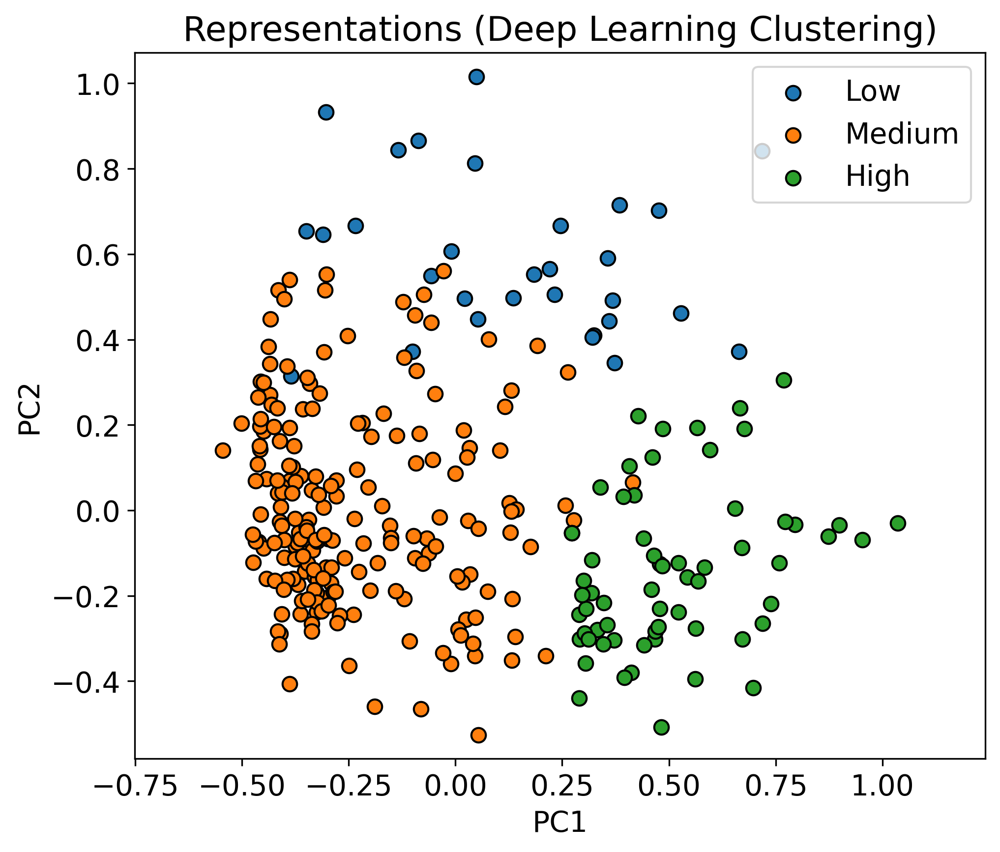

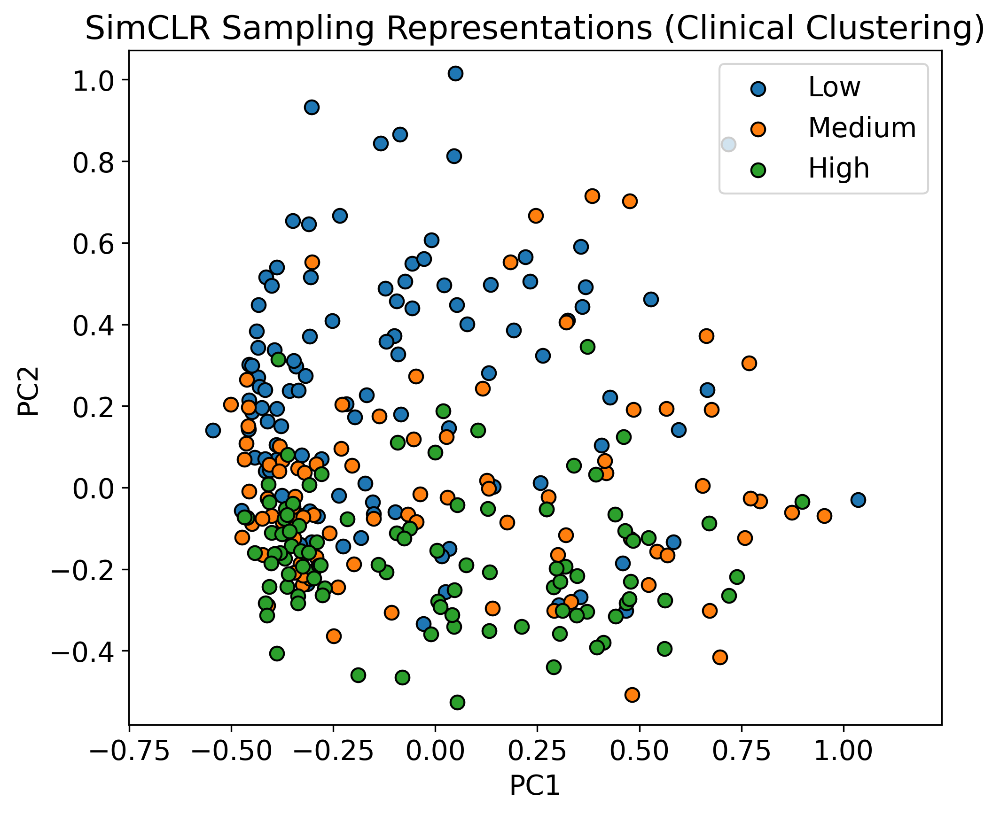

In [108]:
visualize_lowdimensional_clusters(cfg,
                                      df_merged,
                                      x_col='PC1',
                                      y_col='PC2',
                                      color_cols=['cluster_final', 'cluster_fma'],
                                      titles=['Representations (Deep Learning Clustering)', 'SimCLR Sampling Representations (Clinical Clustering)']
                                 )


Plot all days


AttributeError: 'numpy.int64' object has no attribute 'capitalize'

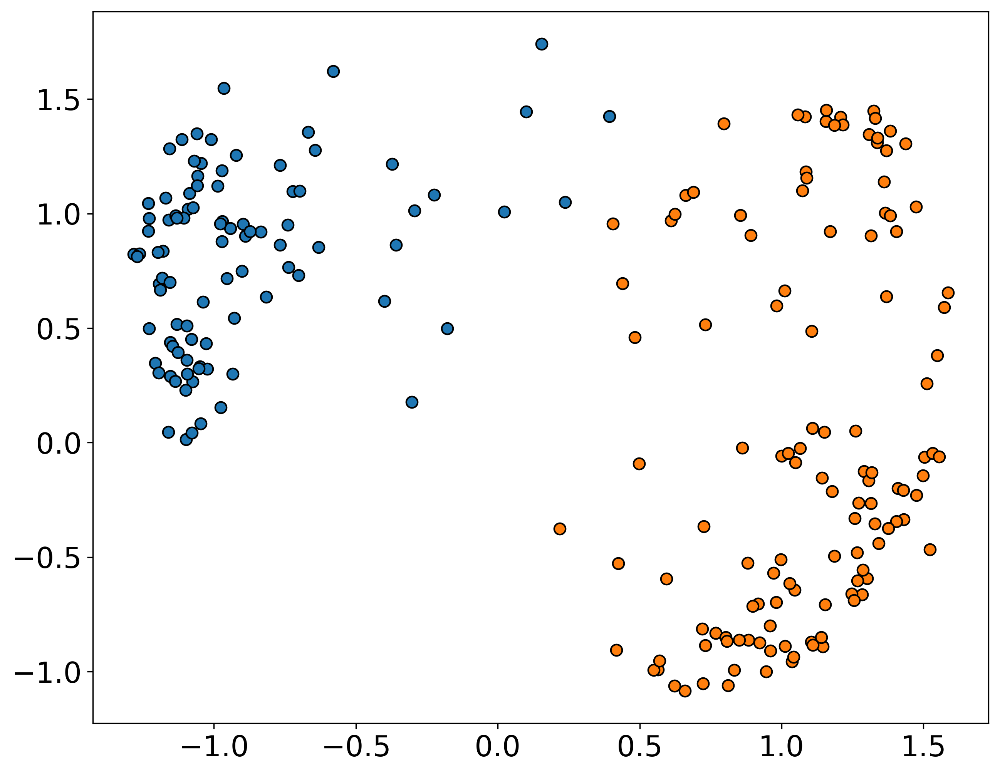

In [55]:
visualize_lowdimensional_clusters(cfg,
                                      df_merged,
                                      x_col='PC1',
                                      y_col='PC2',
                                      color_cols=['cluster_final', 'cluster_fma'],
                                      titles=['Averaged Measurement Embedding, colored by K-Means Clustering','Averaged Measurement Embedding, colored by Clinical FMA Clustering']#First two PC-Embeddings colored by FMA category']
                                     )

In [52]:
# Define a function to compute dominant_side
def compute_dominant_side(row):
    if row['dom_aff_x'] == 1:
        return row['affected_side_x']  # Take the value from affected_side
    else:
        # Take the opposite of affected_side
        return 'right' if row['affected_side_x'] == 'left' else 'left'

# Apply the function row-wise to create the new column
df_merged['dom_side'] = df_merged.apply(compute_dominant_side, axis=1)
print(df_merged[['dom_aff_x', 'affected_side_x', 'dom_side']].drop_duplicates())

    dom_aff_x affected_side_x dom_side
0         1.0           right    right
7         0.0            left    right
18        0.0           right     left
36        1.0            left     left



Plot all days


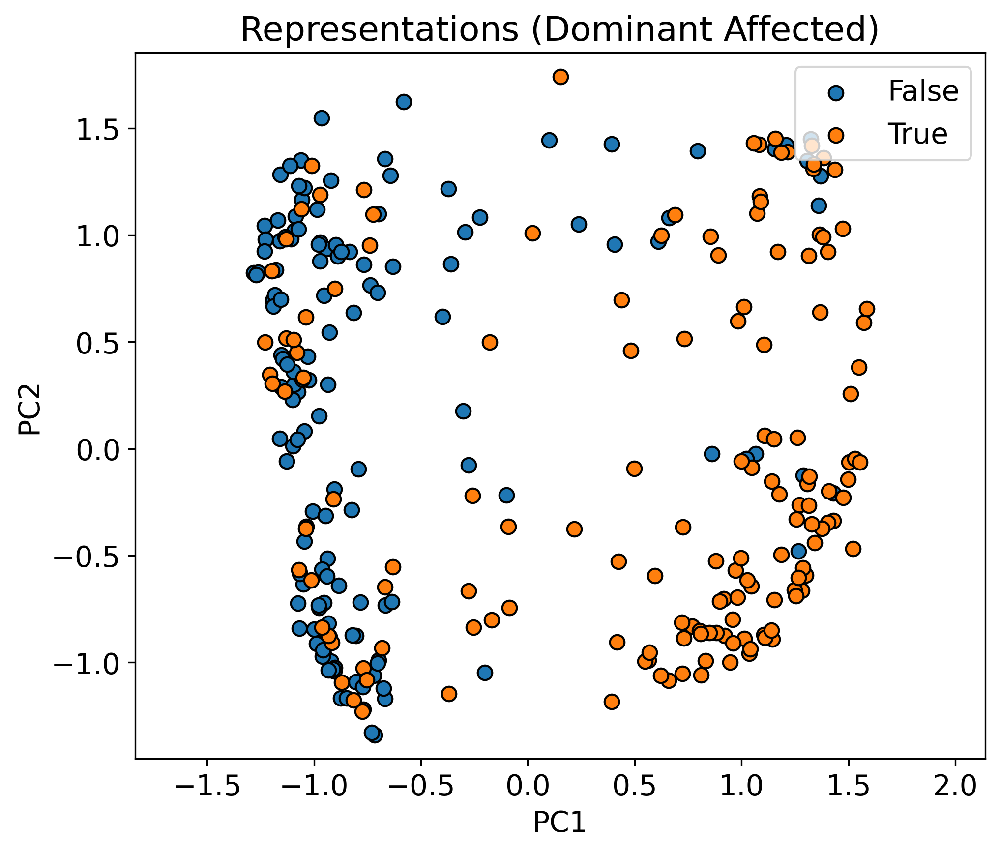

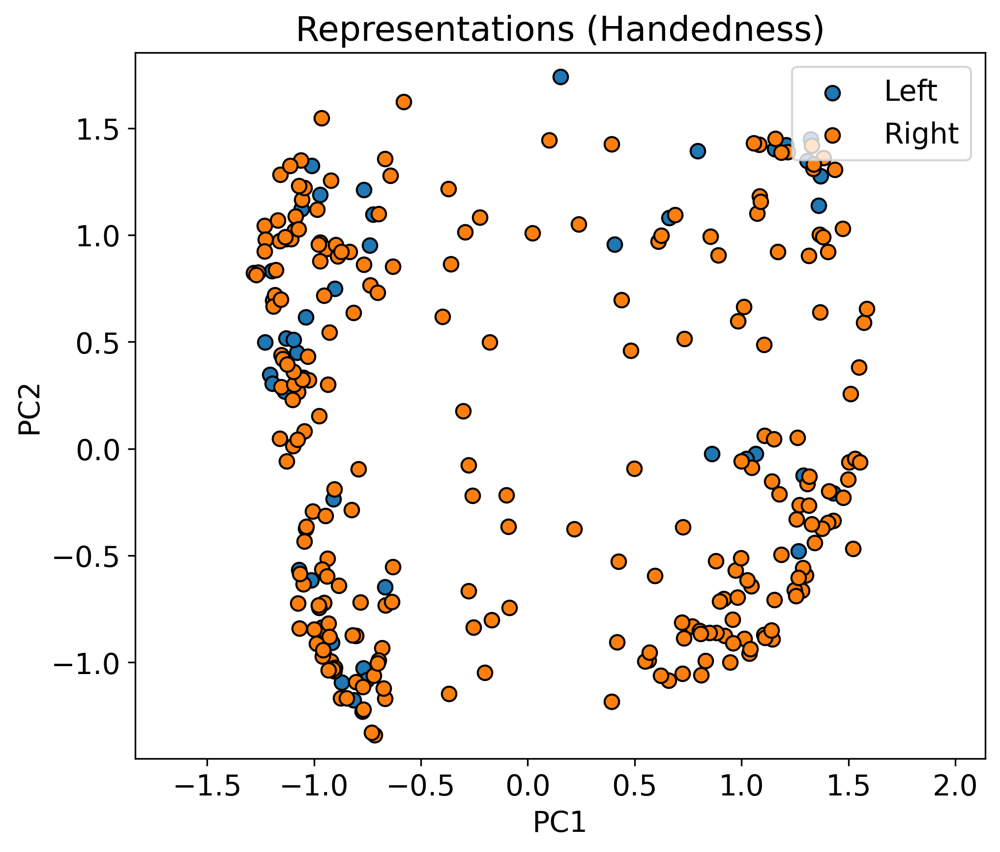

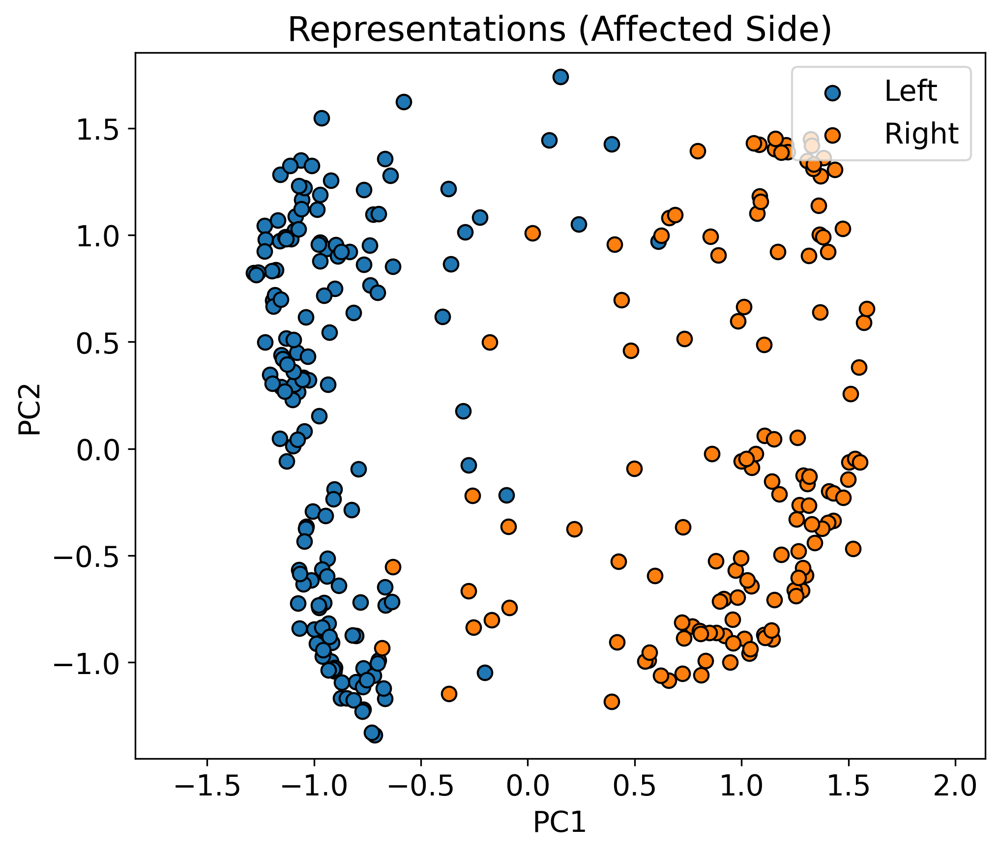

In [87]:
visualize_lowdimensional_clusters(cfg, df_merged, x_col='PC1', y_col='PC2', color_cols=['dom_aff_x', 'dom_side', 'affected_side_x'], titles=['Representations (Dominant Affected)','Representations (Handedness)', 'Representations (Affected Side)'])#color_cols=['gender_x'], titles=['Representations (Gender)'])#color_cols=['dom_aff_x', 'dom_side', 'gender_x', 'affected_side_x'], titles=['Representations (Dominant Affected)','Representations (Handedness)', 'Representations (Gender)','Representations (Affected Side)'])

In [49]:
print(df_merged.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 73 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pat_id                    292 non-null    object 
 1   Pat_id_new                292 non-null    float64
 2   visit                     292 non-null    object 
 3   fma_ue_aff_total          292 non-null    float64
 4   age_x                     292 non-null    int64  
 5   dom_aff_x                 292 non-null    float64
 6   gender_x                  292 non-null    float64
 7   affected_side_x           292 non-null    object 
 8   Unnamed: 0                292 non-null    int64  
 9   index                     292 non-null    int64  
 10  day_visit                 292 non-null    float64
 11  age_y                     292 non-null    int64  
 12  gender_y                  86 non-null     float64
 13  dom_aff_y                 86 non-null     float64
 14  arat_aff_t

In [8]:
# Adjust pandas options to display the entire DataFrame
pd.set_option('display.max_rows', None)  # Show all rows
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.width', None)  # Adjust the display width to fit the notebook
pd.set_option('display.colheader_justify', 'left')  # Align column headers to the left

In [9]:
import pandas as pd

# Group the data by 'cluster_kmeans' and calculate the required metrics
result = df_merged.groupby('cluster_final').agg({
    'use_Dur_aff': ['mean', 'min', 'max', 'std', 'count'], 
    'use_Dur_ratio': ['mean', 'min', 'max', 'std', 'count'],
    'Median_AC_aff': ['mean', 'min', 'max', 'std', 'count'],
    'Median_Magn_ratio': ['mean', 'min', 'max', 'std', 'count'],
    'sd_Magn_aff': ['mean', 'min', 'max', 'std', 'count'],
    'variation_ratio': ['mean', 'min', 'max', 'std', 'count'],
    'mean_Jerk_aff': ['mean', 'min', 'max', 'std', 'count'],
    'mean_Jerk_ratio': ['mean', 'min', 'max', 'std', 'count'],
    'fma_ue_aff_total': ['mean', 'min', 'max', 'std', 'count'],
})

# Dynamically rename columns for clarity
# Flatten the multi-level column index into a single level
result.columns = ['_'.join(col).strip() for col in result.columns]

# Reset index to make 'cluster_kmeans' a column in the result
result = result.reset_index()

# Display the result
result
#print(result)

,cluster_final,use_Dur_aff_mean,use_Dur_aff_min,use_Dur_aff_max,use_Dur_aff_std,use_Dur_aff_count,use_Dur_ratio_mean,use_Dur_ratio_min,use_Dur_ratio_max,use_Dur_ratio_std,use_Dur_ratio_count,Median_AC_aff_mean,Median_AC_aff_min,Median_AC_aff_max,Median_AC_aff_std,Median_AC_aff_count,Median_Magn_ratio_mean,Median_Magn_ratio_min,Median_Magn_ratio_max,Median_Magn_ratio_std,Median_Magn_ratio_count,sd_Magn_aff_mean,sd_Magn_aff_min,sd_Magn_aff_max,sd_Magn_aff_std,sd_Magn_aff_count,variation_ratio_mean,variation_ratio_min,variation_ratio_max,variation_ratio_std,variation_ratio_count,mean_Jerk_aff_mean,mean_Jerk_aff_min,mean_Jerk_aff_max,mean_Jerk_aff_std,mean_Jerk_aff_count,mean_Jerk_ratio_mean,mean_Jerk_ratio_min,mean_Jerk_ratio_max,mean_Jerk_ratio_std,mean_Jerk_ratio_count,fma_ue_aff_total_mean,fma_ue_aff_total_min,fma_ue_aff_total_max,fma_ue_aff_total_std,fma_ue_aff_total_count
0,0,88.345042,9.500000,376.508333,74.594560,93,0.286913,0.060229,2.079643,0.243920,93,30.199821,15.500000,48.666667,6.539527,93,-6.630603,-7.0,-0.852032,1.282824,93,47.831955,27.710285,82.840208,9.354967,93,0.706429,0.380166,1.266253,0.196774,93,0.266353,0.096712,0.725707,0.124074,93,0.401512,0.182167,0.921165,0.121513,93,15.075269,1.0,61.0,11.219390,93
1,1,224.752552,18.166667,596.805556,131.498282,123,0.705722,0.074060,3.122189,0.356820,123,45.575203,18.250000,84.000000,15.917405,123,-2.387881,-7.0,0.261621,2.966840,123,57.750594,34.452369,92.657206,12.326656,123,0.832278,0.430211,8.175734,0.681978,123,0.477883,0.088893,1.456478,0.256669,123,0.667304,0.230380,1.177155,0.221115,123,37.617886,4.0,66.0,18.992889,123
2,2,287.833704,49.122222,517.041667,98.536663,75,0.852151,0.507401,1.673933,0.211636,75,51.280000,28.666667,86.000000,11.598843,75,-0.605123,-7.0,3.363499,1.513166,75,61.117443,39.222019,86.404335,10.004129,75,0.847358,0.493838,1.424903,0.176344,75,0.605987,0.147633,1.946855,0.247500,75,0.787009,0.372430,2.109661,0.259619,75,51.052632,25.0,66.0,10.539949,76
